# belief eye neural analysis


## imports

In [2]:
%reload_ext autoreload
%autoreload 2

In [3]:
import sys
import os
from pathlib import Path
import configparser
config = configparser.ConfigParser()
config.read_file(open('privateconfig'))
resdir = Path(config['Datafolder']['data'])
workdir = Path(config['Codefolder']['workspace'])
os.chdir(workdir)

In [4]:
# analysis
from scipy.io import loadmat
from sklearn.decomposition import FastICA
from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression
from sklearn.model_selection import KFold
from sklearn.linear_model import LassoCV, Lasso
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr
from sklearn.cross_decomposition import CCA

In [5]:
# misc
import pickle
from collections import defaultdict

In [6]:
from neural_plot_ult import *
import time
tic=time.time()
import warnings
warnings.filterwarnings('ignore')

## load data

In [7]:
df = pd.read_pickle(resdir/'1014_m51df.pkl')
len(df)
df=df[df.session==41]

In [8]:
def process_one(y):
    related_taskvar=np.array(normalize_z(y))
    mask=(related_taskvar > -4) & (related_taskvar < 4)
    related_taskvar[~mask]=0
    return related_taskvar, mask

def process(rawtaskvar, returnmask=False):
    # normalize each item to 0 mean 1 std
    rawtaskvar=[np.array(normalize_z(y)) for y in rawtaskvar]
    related_taskvar=np.vstack(rawtaskvar).T
    # related_taskvar=np.clip(related_taskvar,-4,4)
    mask=(related_taskvar > -4) & (related_taskvar < 4)
    mask=np.all(mask, axis=1)
    related_taskvar=related_taskvar[mask]
    if returnmask:
        return related_taskvar, mask
    return related_taskvar
def process_list(rawtaskvar, returnmask=False):
    # normalize each item to 0 mean 1 std
    rawtaskvar=[np.array(normalize_z(y)) for y in rawtaskvar]
    mask=[(a > -4) & (a < 4) for a in rawtaskvar]
    mask=np.all(mask)
    related_taskvar=[a[mask] for a in rawtaskvar]
    if returnmask:
        return related_taskvar, mask
    return related_taskvar

In [9]:
# error distribution
def get_stop_error(row):
    return ((row.fx[-1]-row.mx[-1])**2+(row.fy[-1]-row.my[-1])**2)**0.5
df['state_error']=df.apply(get_stop_error, axis=1)
def get_stop_error(row):
    return ((row.fx[-1]-row.bmx[-1])**2+(row.fy[-1]-row.bmy[-1])**2)**0.5
df['belief_error']=df.apply(get_stop_error, axis=1)

# time ratio
df['time_ratio']=df.apply(lambda x: x.timer/x.timer[-1], axis=1)


In [10]:
for session in sorted(df.session.unique())[:1]:
    sessdf=df[(df.session==session)]

state=np.concatenate(sessdf.belief_ff_hori.to_numpy())
belief=np.concatenate(sessdf.ff_hori.to_numpy())
eye=np.concatenate(sessdf.eye_hori.to_numpy())
timeratio=np.concatenate(sessdf.time_ratio.to_numpy())
timer=np.concatenate(sessdf.timer.to_numpy())
countdown=np.concatenate(sessdf.countdown.to_numpy())


In [11]:
sessdf.columns

Index(['trial', 'session', 'fullon', 'density', 'eye_hori', 'eye_vert',
       'ff_hori', 'ff_vert', 'fx', 'fy', 'mx', 'my', 'mv', 'mw', 'PPC',
       'PPC_var', 'PFC', 'PFC_var', 'MST', 'MST_var', 'error', 'error_sign',
       'target_angle', 'target_distance', 'state', 'action', 'task',
       'likelihood', 'belief', 'rawcov', 'bmx', 'bmy', 'heading',
       'belief_heading', 'timer', 'countdown', 'belief_ff_hori',
       'belief_ff_vert', 'angle_from_start', 'belief_angle_from_start',
       'relcov', 'state_error', 'belief_error', 'time_ratio'],
      dtype='object')

In [12]:
# make a df by time (each row is a time, instead of a trial)
sessdf['density_t']=sessdf.apply(lambda x: np.array([[x.density]*len(x.mx)]).reshape(-1), axis=1)
sessdf['fullon_t']=sessdf.apply(lambda x: np.array([[x.fullon]*len(x.mx)]).reshape(-1), axis=1)
sessdf['error_t']=sessdf.apply(lambda x: np.array([[x.error]*len(x.mx)]).reshape(-1), axis=1)
sessdf['triallen_t']=sessdf.apply(lambda x: np.array([[len(x.mx)]*len(x.mx)]).reshape(-1), axis=1)

timedf=pd.DataFrame({'timer':timer})
# timedf['rawcov']=list(np.vstack(sessdf['rawcov'].to_numpy()))
timedf['belief']=np.concatenate(sessdf.belief_ff_hori.to_numpy())
timedf['state']=np.concatenate(sessdf.ff_hori.to_numpy())
timedf['eye']=np.concatenate(sessdf.eye_hori.to_numpy())
timedf['timeratio']=np.concatenate(sessdf.time_ratio.to_numpy())
timedf['mv']=np.concatenate(sessdf.mv.to_numpy())
timedf['mw']=np.concatenate(sessdf.mw.to_numpy())
timedf['belief_heading']=np.concatenate(sessdf.belief_heading.to_numpy())
timedf['timer']=np.concatenate(sessdf.timer.to_numpy())
timedf['countdown']=np.concatenate(sessdf.countdown.to_numpy())
timedf['belief_angle_from_start']=np.concatenate(sessdf.belief_angle_from_start.to_numpy())
timedf['PPC']=list(np.vstack(sessdf.PPC.to_numpy()))
timedf['PPC_var']=list(np.vstack(sessdf.PPC_var.to_numpy()))

timedf['uncertainty']=list(np.concatenate(sessdf.relcov.to_numpy()))

timedf['density']=np.concatenate(sessdf.density_t.to_numpy())
timedf['fullon']=np.concatenate(sessdf.fullon_t.to_numpy())
timedf['error']=np.concatenate(sessdf.error_t.to_numpy())


timedf['dbelief']=np.concatenate(sessdf.apply(lambda x: np.diff(x.belief_ff_hori, prepend=x.belief_ff_hori[:1],axis=0),axis=1).to_numpy())
timedf['deye']=np.concatenate(sessdf.apply(lambda x: np.diff(x.eye_hori, prepend=x.eye_hori[:1],axis=0),axis=1).to_numpy())
timedf['dneural']=list(np.vstack(sessdf.apply(lambda x: np.diff(x.PPC, prepend=x.PPC[:1], axis=0),axis=1).to_numpy()))


timedf.head()
timedf = timedf.dropna(subset=['eye', 'state', 'belief'])

# plot

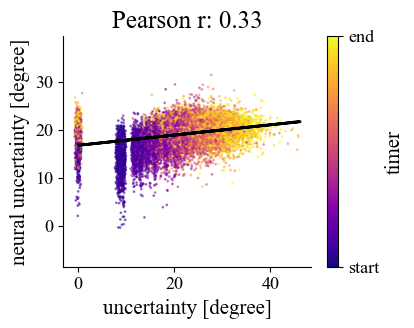

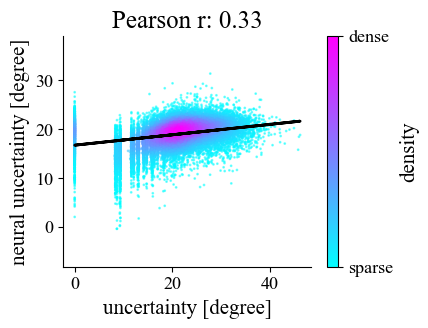

In [13]:
'''use neural variance'''
'''#neural to uncertainty (hori direction. **0.5 to same unit)'''

trialstart=2 # need to be >1 to take diffs.
thisx,thisy,thisc=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()]), np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[trialstart:] for a in sessdf.time_ratio.to_numpy()]) 
thisxname, thisyname, thiscname='neural uncertainty [degree]', 'uncertainty [degree]','timer'

model = LinearRegression()
model.fit(thisx,thisy)
thispred=model.predict(thisx)

fig, ax = plt.subplots(figsize=(4,3))
c=ax.scatter(thisy+np.random.randn(*thisc.shape)*0.25,thispred, c=thisc, cmap='plasma', s=1, alpha=0.5)
cbar=plt.colorbar(c, label=f'{thiscname}')
cbar.set_ticks([min(thisc),max(thisc)],labels=['start','end'])
cbar.solids.set_edgecolor("face")
cbar.solids.set_alpha(1) 
slope=plot_best_fit(thisy, thispred, ax)
r,_=pearsonr(thisy,thispred)
ax.set_title(f'Pearson r: {r:.2f}')
ax.set_ylabel(f'{thisxname}')
ax.set_xlabel(f'{thisyname}')
ax.axis('equal')
plt.show()

scatter_density=compute_scatter_density(thisy,thispred)
fig, ax = plt.subplots(figsize=(4,3))
c=ax.scatter(thisy,thispred, c=scatter_density, cmap='cool', s=1, alpha=0.5)
cbar=plt.colorbar(c, label=f'density', ticks=[0,1])
cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
cbar.solids.set_edgecolor("face")
cbar.solids.set_alpha(1) 
slope=plot_best_fit(thisy, thispred, ax)
r,_=pearsonr(thisy,thispred)
ax.set_title(f'Pearson r: {r:.2f}')
ax.set_ylabel(f'{thisxname}')
ax.set_xlabel(f'{thisyname}')
ax.axis('equal')
plt.show()

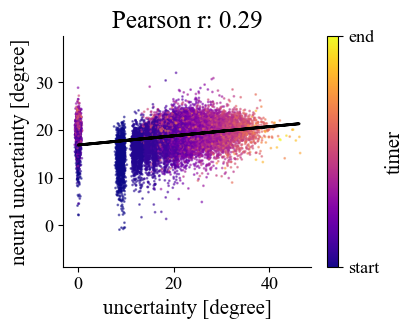

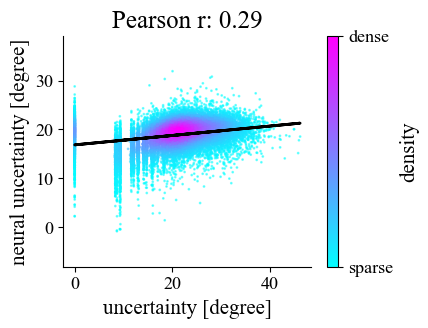

In [14]:
'''same plot, double check with trial timer, instead of time ratio'''

trialstart=2 # need to be >1 to take diffs.
thisx,thisy,thisc=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()]), np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[trialstart:] for a in sessdf.timer.to_numpy()]) 
thisxname, thisyname, thiscname='neural uncertainty [degree]', 'uncertainty [degree]','timer'



model = LinearRegression()
model.fit(thisx,thisy)
# thispred=model.predict(thisx)
thispred = cross_val_predict(model, thisx,thisy, cv=5)


fig, ax = plt.subplots(figsize=(4,3))
c=ax.scatter(thisy+np.random.randn(*thisc.shape)*0.25,thispred, c=thisc, cmap='plasma', s=1, alpha=0.5)
cbar=plt.colorbar(c, label=f'{thiscname}')
cbar.set_ticks([min(thisc),max(thisc)],labels=['start','end'])
cbar.solids.set_edgecolor("face")
cbar.solids.set_alpha(1) 
slope=plot_best_fit(thisy, thispred, ax)
r,_=pearsonr(thisy,thispred)
ax.set_title(f'Pearson r: {r:.2f}')
ax.set_ylabel(f'{thisxname}')
ax.set_xlabel(f'{thisyname}')
ax.axis('equal')
plt.show()

scatter_density=compute_scatter_density(thisy,thispred)
fig, ax = plt.subplots(figsize=(4,3))
c=ax.scatter(thisy,thispred, c=scatter_density, cmap='cool', s=1, alpha=0.5)
cbar=plt.colorbar(c, label=f'density', ticks=[0,1])
cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
cbar.solids.set_edgecolor("face")
cbar.solids.set_alpha(1) 
slope=plot_best_fit(thisy, thispred, ax)
r,_=pearsonr(thisy,thispred)
ax.set_title(f'Pearson r: {r:.2f}')
ax.set_ylabel(f'{thisxname}')
ax.set_xlabel(f'{thisyname}')
ax.axis('equal')
plt.show()

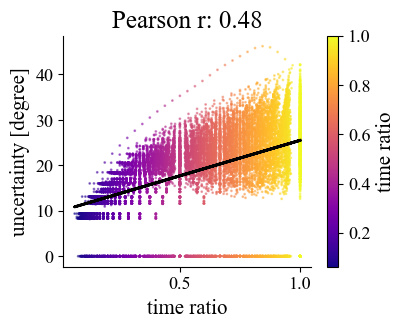

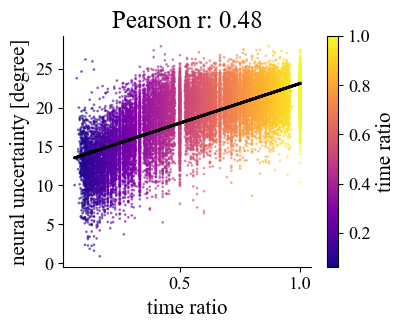

In [15]:
'''# uncertainty tightly correlate with time'''
# neural_data,beh_uncertainty,thisc=np.stack(timedf.PPC.to_numpy()),np.stack(timedf['uncertainty'].to_numpy())[:,0,0],timedf.timer.to_numpy()
# # beh_uncertainty,thisc=zip(*process_list([beh_uncertainty,thisc]))
# neural_data,beh_uncertainty,thisc=np.array(neural_data),np.array(beh_uncertainty),np.array(thisc)
# # thisc,_=process_one(thisc)'

trialstart=2 # need to be >1 to take diffs.
neural_data,beh_uncertainty,thisc=np.concatenate([a[trialstart:] for a in sessdf.PPC.to_numpy()]), np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[trialstart:] for a in sessdf.time_ratio.to_numpy()]) 
thiscname='time ratio'

model = LinearRegression()
model.fit(neural_data,beh_uncertainty)
# neural_uncertainty=model.predict(neural_data)
neural_uncertainty = cross_val_predict(model, neural_data,beh_uncertainty, cv=5)

fig, ax = plt.subplots(figsize=(4,3))
c=ax.scatter(thisc,beh_uncertainty+np.random.randn(*thisc.shape)*0., c=thisc, cmap='plasma', s=1, alpha=0.5)
cbar=plt.colorbar(c, label=f'{thiscname}')
solidcbar(cbar)
slope=plot_best_fit(thisc,beh_uncertainty, ax)
r,_=pearsonr(thisc,beh_uncertainty)
ax.set_title(f'Pearson r: {r:.2f}')
ax.set_xlabel(f'{thiscname}')
ax.set_ylabel('uncertainty [degree]')
# ax.axis('equal')
plt.show()

fig, ax = plt.subplots(figsize=(4,3))
c=ax.scatter(thisc+np.random.randn(*thisc.shape)*0.,neural_uncertainty, c=thisc, cmap='plasma', s=1, alpha=0.5)
cbar=plt.colorbar(c, label=f'{thiscname}')
solidcbar(cbar)
slope=plot_best_fit(thisc,neural_uncertainty, ax)
r,_=pearsonr(thisc,beh_uncertainty)
ax.set_title(f'Pearson r: {r:.2f}')
ax.set_xlabel(f'{thiscname}')
ax.set_ylabel('neural uncertainty [degree]')
# ax.axis('equal')
plt.show()

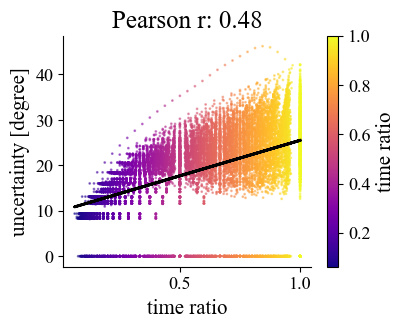

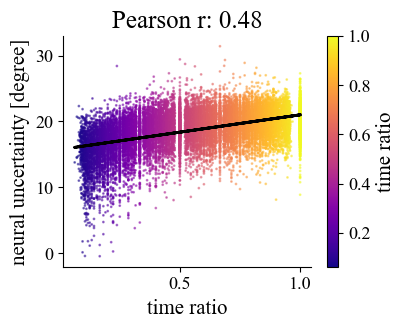

In [16]:
'''# uncertainty tightly correlate with time. use neural variance'''
# neural_data,beh_uncertainty,thisc=np.stack(timedf.PPC.to_numpy()),np.stack(timedf['uncertainty'].to_numpy())[:,0,0],timedf.timer.to_numpy()
# # beh_uncertainty,thisc=zip(*process_list([beh_uncertainty,thisc]))
# neural_data,beh_uncertainty,thisc=np.array(neural_data),np.array(beh_uncertainty),np.array(thisc)
# # thisc,_=process_one(thisc)'

trialstart=2 # need to be >1 to take diffs.
neural_data,beh_uncertainty,thisc=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()]), np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[trialstart:] for a in sessdf.time_ratio.to_numpy()]) 
thiscname='time ratio'

model = LinearRegression()
model.fit(neural_data,beh_uncertainty)
neural_uncertainty=model.predict(neural_data)

fig, ax = plt.subplots(figsize=(4,3))
c=ax.scatter(thisc,beh_uncertainty+np.random.randn(*thisc.shape)*0., c=thisc, cmap='plasma', s=1, alpha=0.5)
cbar=plt.colorbar(c, label=f'{thiscname}')
solidcbar(cbar)
slope=plot_best_fit(thisc,beh_uncertainty, ax)
r,_=pearsonr(thisc,beh_uncertainty)
ax.set_title(f'Pearson r: {r:.2f}')
ax.set_xlabel(f'{thiscname}')
ax.set_ylabel('uncertainty [degree]')
# ax.axis('equal')
plt.show()

fig, ax = plt.subplots(figsize=(4,3))
c=ax.scatter(thisc+np.random.randn(*thisc.shape)*0.,neural_uncertainty, c=thisc, cmap='plasma', s=1, alpha=0.5)
cbar=plt.colorbar(c, label=f'{thiscname}')
solidcbar(cbar)
slope=plot_best_fit(thisc,neural_uncertainty, ax)
r,_=pearsonr(thisc,beh_uncertainty)
ax.set_title(f'Pearson r: {r:.2f}')
ax.set_xlabel(f'{thiscname}')
ax.set_ylabel('neural uncertainty [degree]')
# ax.axis('equal')
plt.show()

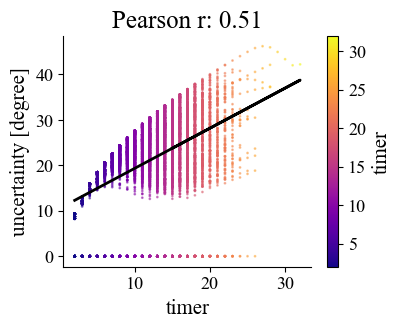

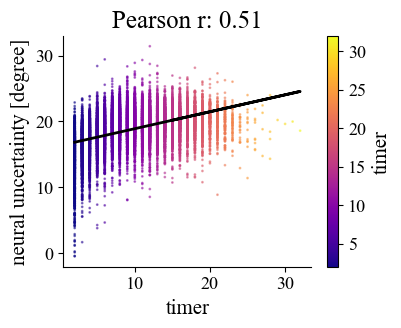

In [17]:
'''# uncertainty tightly correlate with time'''
# neural_data,beh_uncertainty,thisc=np.stack(timedf.PPC.to_numpy()),np.stack(timedf['uncertainty'].to_numpy())[:,0,0],timedf.timer.to_numpy()
# # beh_uncertainty,thisc=zip(*process_list([beh_uncertainty,thisc]))
# neural_data,beh_uncertainty,thisc=np.array(neural_data),np.array(beh_uncertainty),np.array(thisc)
# # thisc,_=process_one(thisc)'

trialstart=2 # need to be >1 to take diffs.
neural_data,beh_uncertainty,thisc=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()]), np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[trialstart:] for a in sessdf.timer.to_numpy()]) 
thiscname='timer'

model = LinearRegression()
model.fit(neural_data,beh_uncertainty)
neural_uncertainty=model.predict(neural_data)

fig, ax = plt.subplots(figsize=(4,3))
c=ax.scatter(thisc,beh_uncertainty+np.random.randn(*thisc.shape)*0., c=thisc, cmap='plasma', s=1, alpha=0.5)
cbar=plt.colorbar(c, label=f'{thiscname}')
solidcbar(cbar)
slope=plot_best_fit(thisc,beh_uncertainty, ax)
r,_=pearsonr(thisc,beh_uncertainty)
ax.set_title(f'Pearson r: {r:.2f}')
ax.set_xlabel(f'{thiscname}')
ax.set_ylabel('uncertainty [degree]')
# ax.axis('equal')
plt.show()

fig, ax = plt.subplots(figsize=(4,3))
c=ax.scatter(thisc+np.random.randn(*thisc.shape)*0.,neural_uncertainty, c=thisc, cmap='plasma', s=1, alpha=0.5)
cbar=plt.colorbar(c, label=f'{thiscname}')
solidcbar(cbar)
slope=plot_best_fit(thisc,neural_uncertainty, ax)
r,_=pearsonr(thisc,beh_uncertainty)
ax.set_title(f'Pearson r: {r:.2f}')
ax.set_xlabel(f'{thiscname}')
ax.set_ylabel('neural uncertainty [degree]')
# ax.axis('equal')
plt.show()

take home msg from above: we can fit neural activity to behavioral belief uncertainty. but it also tightly related to time. need to make sure we found actual uncertainty in neural activity instead of time.

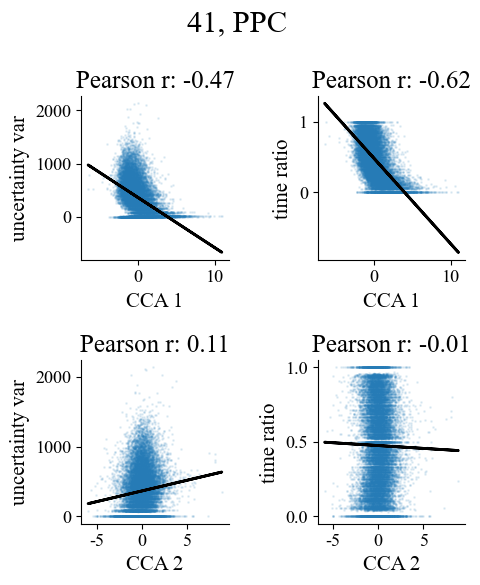

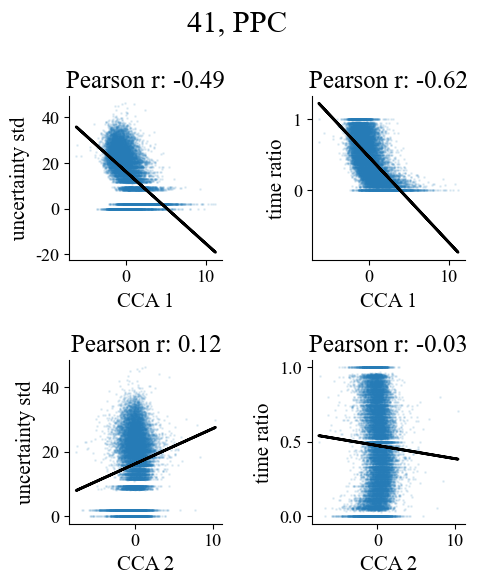

In [18]:
'''
use cca to show neural encode both time and uncertainty

'''
# use variance
thisx,thisy,thisc=np.stack(timedf.PPC_var.to_numpy()),np.stack(timedf.uncertainty.to_numpy())[:,0,0],timedf.timeratio.to_numpy()
# thisy,thisc=zip(*process_list([thisy,thisc]))
thisx,thisy,thisc=np.array(thisx),np.array(thisy),np.array(thisc)
# thisc,_=process_one(thisc)
thisxname, thisyname, thiscname='neural pred uncertainty', 'uncertainty','time ratio'

related_taskvar=np.stack([thisy, thisc]).T
cca = CCA(n_components=2)
cca_neural, cca_be=cca.fit_transform(thisx,related_taskvar )

varname=['uncertainty var', 'time ratio']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(cca_neural[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(cca_neural[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * cca_neural[:,i] + intercept
        ax.plot(cca_neural[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(cca_neural[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'CCA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC', fontsize=22)
plt.tight_layout()
plt.show()


# use std
thisx,thisy,thisc=np.stack(timedf.PPC_var.to_numpy()),np.stack(timedf.uncertainty.to_numpy())[:,0,0]**0.5,timedf.timeratio.to_numpy()
# thisy,thisc=zip(*process_list([thisy,thisc]))
thisx,thisy,thisc=np.array(thisx),np.array(thisy),np.array(thisc)
# thisc,_=process_one(thisc)
thisxname, thisyname, thiscname='neural pred uncertainty', 'uncertainty','time ratio'

related_taskvar=np.stack([thisy, thisc]).T
cca = CCA(n_components=2)
cca_neural, cca_be=cca.fit_transform(thisx,related_taskvar )


varname=['uncertainty std', 'time ratio']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(cca_neural[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(cca_neural[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * cca_neural[:,i] + intercept
        ax.plot(cca_neural[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(cca_neural[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'CCA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC', fontsize=22)
plt.tight_layout()
plt.show()

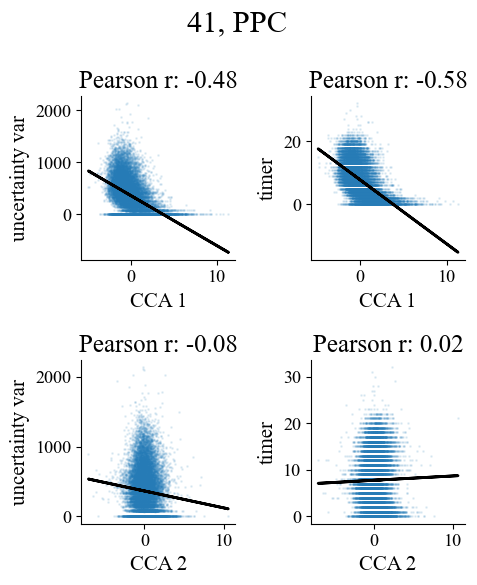

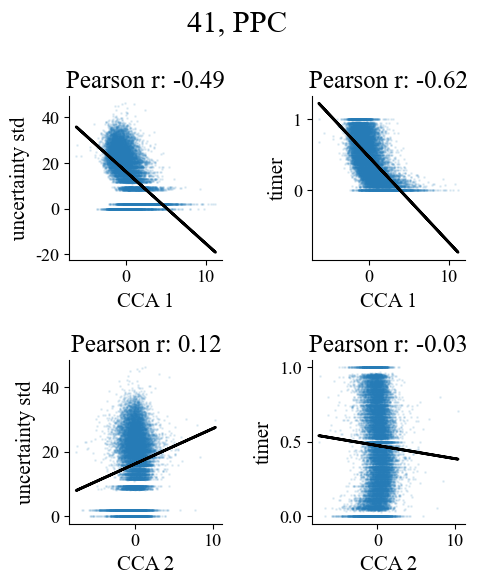

In [19]:
'''
use cca to show neural encode both time and uncertainty

'''
# use variance
thisx,thisy,thisc=np.stack(timedf.PPC_var.to_numpy()),np.stack(timedf.uncertainty.to_numpy())[:,0,0],timedf.timer.to_numpy()
# thisy,thisc=zip(*process_list([thisy,thisc]))
thisx,thisy,thisc=np.array(thisx),np.array(thisy),np.array(thisc)
# thisc,_=process_one(thisc)
thisxname, thisyname, thiscname='neural pred uncertainty', 'uncertainty','timer'

related_taskvar=np.stack([thisy, thisc]).T
cca = CCA(n_components=2)
cca_neural, cca_be=cca.fit_transform(thisx,related_taskvar )

varname=['uncertainty var', 'timer']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(cca_neural[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(cca_neural[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * cca_neural[:,i] + intercept
        ax.plot(cca_neural[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(cca_neural[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'CCA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC', fontsize=22)
plt.tight_layout()
plt.show()


# use std
thisx,thisy,thisc=np.stack(timedf.PPC_var.to_numpy()),np.stack(timedf.uncertainty.to_numpy())[:,0,0]**0.5,timedf.timeratio.to_numpy()
# thisy,thisc=zip(*process_list([thisy,thisc]))
thisx,thisy,thisc=np.array(thisx),np.array(thisy),np.array(thisc)
# thisc,_=process_one(thisc)
thisxname, thisyname, thiscname='neural pred uncertainty', 'uncertainty','timer'

related_taskvar=np.stack([thisy, thisc]).T
cca = CCA(n_components=2)
cca_neural, cca_be=cca.fit_transform(thisx,related_taskvar )


varname=['uncertainty std', 'timer']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(cca_neural[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(cca_neural[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * cca_neural[:,i] + intercept
        ax.plot(cca_neural[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(cca_neural[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'CCA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC', fontsize=22)
plt.tight_layout()
plt.show()

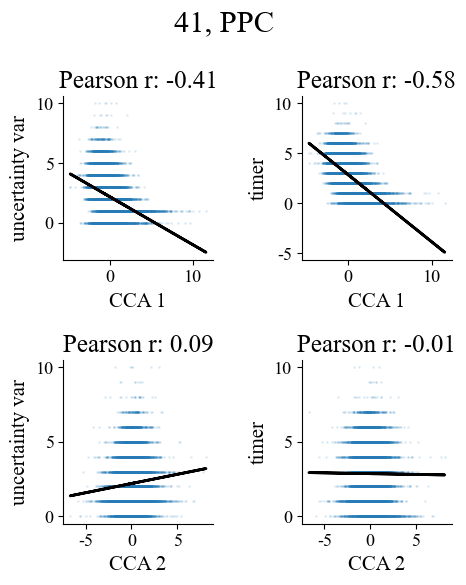

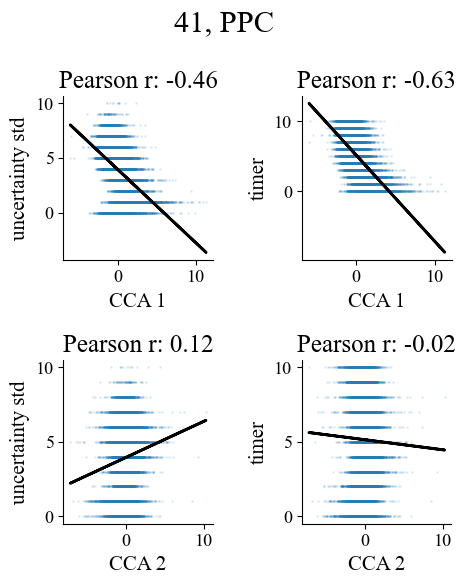

In [20]:
'''
binned timer
use cca to show neural encode both time and uncertainty
'''
# use variance
thisx,thisy,thisc=np.stack(timedf.PPC_var.to_numpy()),np.stack(timedf.uncertainty.to_numpy())[:,0,0],timedf.timer.to_numpy()
# thisy,thisc=zip(*process_list([thisy,thisc]))
thisx,thisy,thisc=np.array(thisx),np.array(thisy),np.array(thisc)
# thisc,_=process_one(thisc)
num_bins = 10
bin_edges = np.linspace(thisc.min(), thisc.max(), num_bins + 1)
thisc = np.digitize(thisc, bin_edges, right=True)
bin_edges = np.linspace(thisy.min(), thisy.max(), num_bins + 1)
thisy = np.digitize(thisy, bin_edges, right=True)

thisxname, thisyname, thiscname='neural pred uncertainty', 'uncertainty','timer'

related_taskvar=np.stack([thisy, thisc]).T
cca = CCA(n_components=2)
cca_neural, cca_be=cca.fit_transform(thisx,related_taskvar )

varname=['uncertainty var', 'timer']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(cca_neural[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(cca_neural[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * cca_neural[:,i] + intercept
        ax.plot(cca_neural[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(cca_neural[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'CCA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC', fontsize=22)
plt.tight_layout()
plt.show()


# use std
thisx,thisy,thisc=np.stack(timedf.PPC_var.to_numpy()),np.stack(timedf.uncertainty.to_numpy())[:,0,0]**0.5,timedf.timeratio.to_numpy()
# thisy,thisc=zip(*process_list([thisy,thisc]))
thisx,thisy,thisc=np.array(thisx),np.array(thisy),np.array(thisc)
# thisc,_=process_one(thisc)
num_bins = 10
bin_edges = np.linspace(thisc.min(), thisc.max(), num_bins + 1)
thisc = np.digitize(thisc, bin_edges, right=True)
bin_edges = np.linspace(thisy.min(), thisy.max(), num_bins + 1)
thisy = np.digitize(thisy, bin_edges, right=True)

thisxname, thisyname, thiscname='neural pred uncertainty', 'uncertainty','timer'

related_taskvar=np.stack([thisy, thisc]).T
cca = CCA(n_components=2)
cca_neural, cca_be=cca.fit_transform(thisx,related_taskvar )


varname=['uncertainty std', 'timer']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(cca_neural[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(cca_neural[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * cca_neural[:,i] + intercept
        ax.plot(cca_neural[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(cca_neural[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'CCA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC', fontsize=22)
plt.tight_layout()
plt.show()

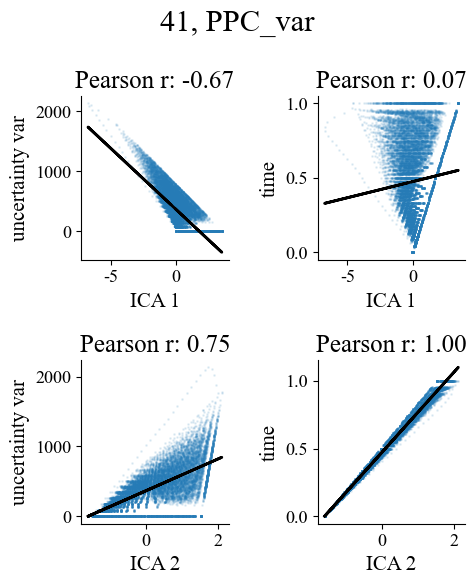

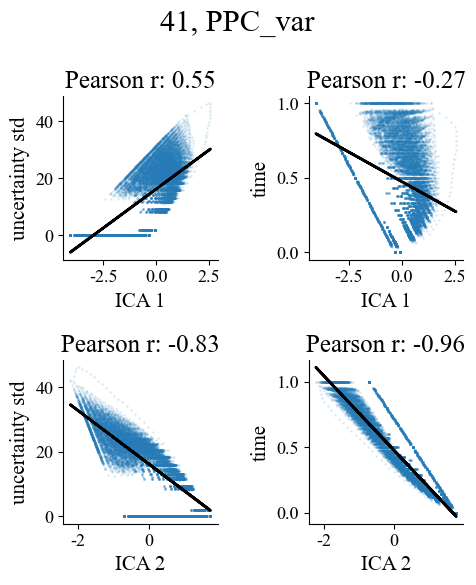

In [21]:
'''# use ica to seperate the time and uncerainty
'''
thisx,thisy,thisc=np.stack(timedf.PPC_var.to_numpy()),np.stack(timedf.uncertainty.to_numpy())[:,0,0],timedf.timeratio.to_numpy()
# thisy,thisc=zip(*process_list([thisy,thisc]))
thisx,thisy,thisc=np.array(thisx),np.array(thisy),np.array(thisc)
# thisc,_=process_one(thisc)
thisxname, thisyname, thiscname='neural pred uncertainty', 'uncertainty','time ratio'

related_taskvar=np.stack([thisy, thisc]).T
ica = FastICA(n_components=2)
icaX=related_taskvar
icaS = ica.fit_transform(icaX) 


varname=['uncertainty var', 'time']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(icaS[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(icaS[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * icaS[:,i] + intercept
        ax.plot(icaS[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(icaS[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'ICA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC_var', fontsize=22)
plt.tight_layout()
plt.show()



thisx,thisy,thisc=np.stack(timedf.PPC_var.to_numpy()),np.stack(timedf.uncertainty.to_numpy())[:,0,0]**0.5,timedf.timeratio.to_numpy()
# thisy,thisc=zip(*process_list([thisy,thisc]))
thisx,thisy,thisc=np.array(thisx),np.array(thisy),np.array(thisc)
# thisc,_=process_one(thisc)
thisxname, thisyname, thiscname='neural pred uncertainty', 'uncertainty','time ratio'

related_taskvar=np.stack([thisy, thisc]).T
ica = FastICA(n_components=2)
icaX=related_taskvar
icaS = ica.fit_transform(icaX) 


varname=['uncertainty std', 'time']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(icaS[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(icaS[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * icaS[:,i] + intercept
        ax.plot(icaS[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(icaS[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'ICA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC_var', fontsize=22)
plt.tight_layout()
plt.show()


# work

idea:

here in this notebook, we study neural encoding of uncertainty.
we have ppc, ddc, mainly.
let focus only on the encoding for now, ignoring their inference and update.
things are simple.

in ppc, neural encode parametric representation of the distribution, meaning the mean and covariance. we confirmed the mean already. so, we just need to fit the neural activity against the covariance.

in ddc, neural encode a sample from the distribution. that is, variance of neural activity reflect the variance of belief uncertainty. we need to somehow meansure this neural variance, and fit it against the covariance. 

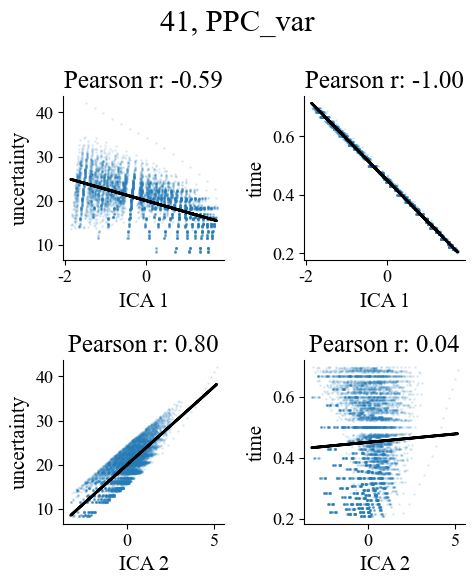

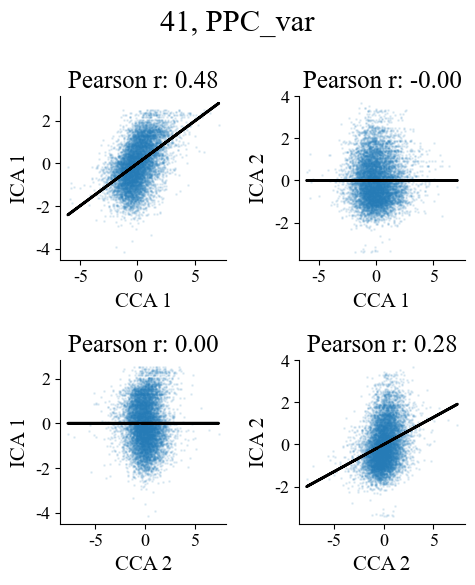

In [22]:
'''only use the tracking part out of 3 segment in a trial. check unceratinty fitting seperately.
conclusion: something. but this method is hard to explain.
'''

# pre tracking 
# thisdf=timedf[(timedf.fullon==0)&((timedf.timeratio<0.2))]

# tracking 
thisdf=timedf[(timedf.fullon==0)&((timedf.timeratio<0.7)&(timedf.timeratio>0.2))]

# post tracking 
# thisdf=timedf[(timedf.fullon==0)&((timedf.timeratio>0.7))]

thisx,thisy,thisc=np.stack(thisdf.PPC_var.to_numpy()),np.stack(thisdf.uncertainty.to_numpy())[:,0,0]**0.5,thisdf.timeratio.to_numpy()
# thisy,thisc=zip(*process_list([thisy,thisc]))
thisx,thisy,thisc=np.array(thisx),np.array(thisy),np.array(thisc)
# thisc,_=process_one(thisc)
thisxname, thisyname, thiscname='neural pred uncertainty', 'uncertainty','time ratio'

related_taskvar=np.stack([thisy, thisc]).T
ica = FastICA(n_components=2)
icaX=related_taskvar
icaS = ica.fit_transform(icaX) 


varname=['uncertainty', 'time']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(icaS[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(icaS[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * icaS[:,i] + intercept
        ax.plot(icaS[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(icaS[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'ICA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC_var', fontsize=22)
plt.tight_layout()
plt.show()


thisx,thisy,thisc=np.stack(thisdf.PPC_var.to_numpy()),np.stack(thisdf.uncertainty.to_numpy())[:,0,0]**0.5,thisdf.timeratio.to_numpy()
# thisy,thisc=zip(*process_list([thisy,thisc]))
thisx,thisy,thisc=np.array(thisx),np.array(thisy),np.array(thisc)
# thisc,_=process_one(thisc)
thisxname, thisyname, thiscname='neural pred uncertainty', 'uncertainty','time ratio'

related_taskvar=np.stack([thisy, thisc]).T
cca = CCA(n_components=2)
cca_neural, cca_be=cca.fit_transform(thisx,icaS )


varname=['ICA 1', 'ICA 2']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(cca_neural[:,i],cca_be[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(cca_neural[:,i],cca_be[:,j], 1)
        best_fit_line = slope * cca_neural[:,i] + intercept
        ax.plot(cca_neural[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(cca_neural[:,i],cca_be[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'CCA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC_var', fontsize=22)
plt.tight_layout()
plt.show()


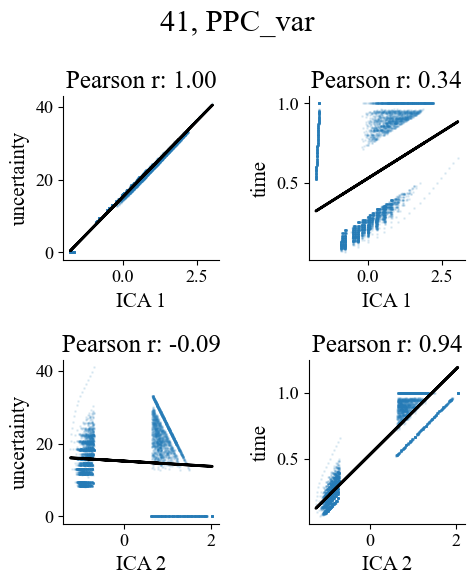

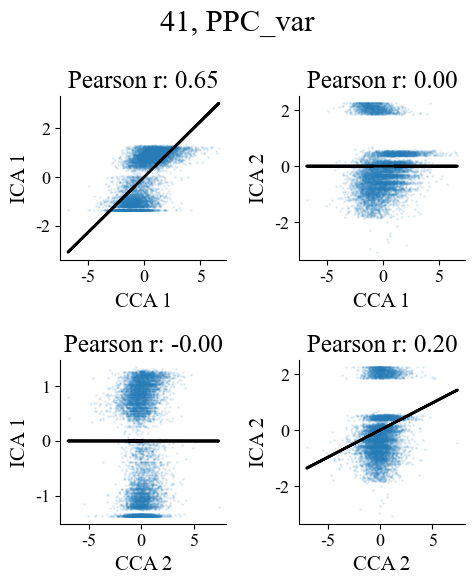

In [23]:
'''same as above, but use decouple data 
'''
trialstart=2 # need to be >1 to take diffs.
neural_data,beh_uncertainty,trial_time=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()]), np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[trialstart:] for a in sessdf.time_ratio.to_numpy()]) 
trial_timename='time ratio'

# get mask (decouple time and uncertainty)
model = LinearRegression()
model.fit(beh_uncertainty.reshape(-1, 1),trial_time)
pred_time=model.predict(beh_uncertainty.reshape(-1, 1))
err=np.array(normalize_z(np.abs(pred_time-trial_time)))
mask=err>0.2
# only use the decouple data to fit
neural_data,beh_uncertainty, trial_time = neural_data[mask],beh_uncertainty[mask], trial_time[mask]
# get neural uncertainty
model = LinearRegression()
model.fit(neural_data,beh_uncertainty)
neural_uncertainty=model.predict(neural_data)


# neural_data,beh_uncertainty,trial_time=np.stack(thisdf.PPC_var.to_numpy()),np.stack(thisdf.uncertainty.to_numpy())[:,0,0]**0.5,thisdf.timeratio.to_numpy()
# # beh_uncertainty,trial_time=zip(*process_list([beh_uncertainty,trial_time]))
# neural_data,beh_uncertainty,trial_time=np.array(neural_data),np.array(beh_uncertainty),np.array(trial_time)
# # trial_time,_=process_one(trial_time)
# neural_dataname, beh_uncertaintyname, trial_timename='neural pred uncertainty', 'uncertainty','time ratio'

related_taskvar=np.stack([beh_uncertainty, trial_time]).T
ica = FastICA(n_components=2)
icaX=related_taskvar
icaS = ica.fit_transform(icaX) 


varname=['uncertainty', 'time']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(icaS[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(icaS[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * icaS[:,i] + intercept
        ax.plot(icaS[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(icaS[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'ICA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC_var', fontsize=22)
plt.tight_layout()
plt.show()


trialstart=2 # need to be >1 to take diffs.
neural_data,beh_uncertainty,trial_time=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()]), np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[trialstart:] for a in sessdf.time_ratio.to_numpy()]) 
trial_timename='time ratio'

# get mask (decouple time and uncertainty)
model = LinearRegression()
model.fit(beh_uncertainty.reshape(-1, 1),trial_time)
pred_time=model.predict(beh_uncertainty.reshape(-1, 1))
err=np.array(normalize_z(np.abs(pred_time-trial_time)))
mask=err>0.2
# only use the decouple data to fit
neural_data,beh_uncertainty, trial_time = neural_data[mask],beh_uncertainty[mask], trial_time[mask]
# get neural uncertainty
model = LinearRegression()
model.fit(neural_data,beh_uncertainty)
neural_uncertainty=model.predict(neural_data)

neural_dataname, beh_uncertaintyname, trial_timename='neural pred uncertainty', 'uncertainty','time ratio'

related_taskvar=np.stack([beh_uncertainty, trial_time]).T
cca = CCA(n_components=2)
cca_neural, cca_be=cca.fit_transform(neural_data,icaS )


varname=['ICA 1', 'ICA 2']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(cca_neural[:,i],cca_be[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(cca_neural[:,i],cca_be[:,j], 1)
        best_fit_line = slope * cca_neural[:,i] + intercept
        ax.plot(cca_neural[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(cca_neural[:,i],cca_be[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'CCA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC_var', fontsize=22)
plt.tight_layout()
plt.show()

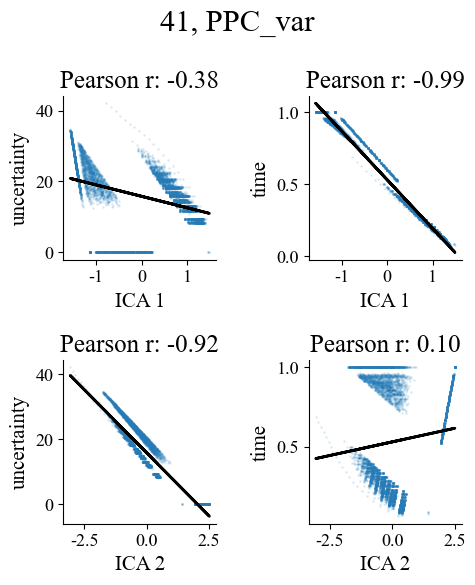

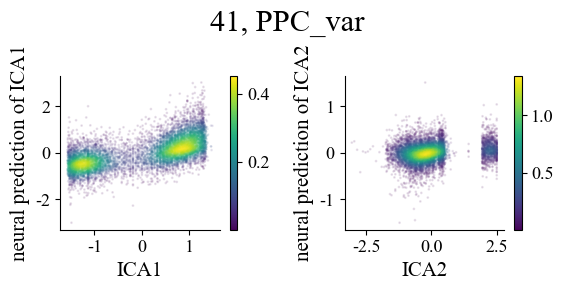

In [24]:
'''use ica to sperate time and uncertainty, and use neural to fit the isolated uncertainty component.
'''
trialstart=2 # need to be >1 to take diffs.
neural_data,beh_uncertainty,trial_time=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()]), np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[trialstart:] for a in sessdf.time_ratio.to_numpy()]) 
trial_timename='time ratio'

# get mask (decouple time and uncertainty)
model = LinearRegression()
model.fit(beh_uncertainty.reshape(-1, 1),trial_time)
pred_time=model.predict(beh_uncertainty.reshape(-1, 1))
err=np.array(normalize_z(np.abs(pred_time-trial_time)))
mask=err>0.05
# only use the decouple data to fit
neural_data,beh_uncertainty, trial_time = neural_data[mask],beh_uncertainty[mask], trial_time[mask]


related_taskvar=np.stack([beh_uncertainty, trial_time]).T
ica = FastICA(n_components=2)
icaX=related_taskvar
icaS = ica.fit_transform(icaX) 

varname=['uncertainty', 'time']
fig, axs = plt.subplots(2,2, figsize=(5,6))
for i in range(2):
    for j in range(2):
        ax=axs[i,j]
        ax.scatter(icaS[:,i],related_taskvar[:,j], s=1, alpha=0.1)
        # best fit line
        slope, intercept = np.polyfit(icaS[:,i],related_taskvar[:,j], 1)
        best_fit_line = slope * icaS[:,i] + intercept
        ax.plot(icaS[:,i], best_fit_line, color='black')
        # quickallspine(ax)
        # ax.axis('equal')
        r,_=pearsonr(icaS[:,i],related_taskvar[:,j])
        # ax.set_title(f'x: cca {i+1} \ny: {varname[j]}\nPeason r: {r:.2f}')
        ax.set_title(f'Pearson r: {r:.2f}')
        ax.set_xlabel(f'ICA {i+1}')
        ax.set_ylabel(f'{varname[j]}')
plt.suptitle(f'{session}, PPC_var', fontsize=22)
plt.tight_layout()
plt.show()


fig, axs = plt.subplots(1,2, figsize=(6,3))
for j in range(2):
    ax=axs[j]
    ica_isolate=icaS[:,j]
    model=LinearRegression()
    model.fit(neural_data, ica_isolate)
    neural_uncertainty_component=model.predict(neural_data)
    scatter_density=compute_scatter_density(ica_isolate, neural_uncertainty_component)
    c=ax.scatter(ica_isolate, neural_uncertainty_component,c=scatter_density, s=1, alpha=0.1)
    cbar=plt.colorbar(c)
    solidcbar(cbar)
    ax.set_xlabel(f'ICA{j+1}')
    ax.set_ylabel(f'neural prediction of ICA{j+1}')
plt.suptitle(f'{session}, PPC_var', fontsize=22)
plt.tight_layout()
plt.show()

In [25]:
# # neural uncertainty heading vs observation. a inital check
# thisx, thisy=np.concatenate([a[:-1] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[:-1] for a in sessdf.mw.to_numpy()])
# thisy=np.abs(thisy)

# neural_data=np.concatenate([a[:-1] for a in sessdf.PPC.to_numpy()])
# model = LinearRegression()
# model.fit(neural_data, thisx)
# pred=model.predict(neural_data)

# fig,ax=plt.subplots(1,1)
# plt.scatter(thisx,thisy,s=1,alpha=0.3)
# plt.xlabel('behavior belief uncertainty, degree')
# plt.ylabel('observation, degree/dt')
# # plt.axis('equal')
# plt.show()

# fig,ax=plt.subplots(1,1)
# plt.scatter(pred,thisy,s=1,alpha=0.3)
# plt.xlabel('neural belief uncertainty, degree')
# plt.ylabel('observation, degree/dt')
# # plt.axis('equal')
# plt.show()

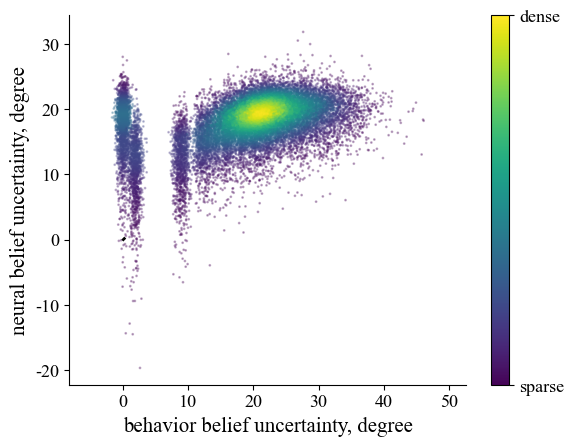

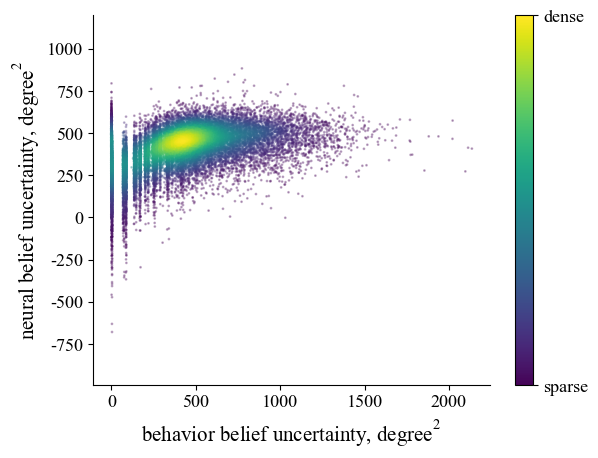

In [26]:
# neural uncertainty vs behavior uncertainty
# we have some level of neural encoding, in std not in variance?

# fit neural for std
thisx, thisy=np.concatenate([a[1:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[1:] for a in sessdf.mw.to_numpy()]) # std
thisy=np.abs(thisy)

neural_data=np.concatenate([a[1:] for a in sessdf.PPC_var.to_numpy()])
model = LinearRegression()
model.fit(neural_data, thisx)
pred=model.predict(neural_data) # neural belief uncertainty
scatter_density=compute_scatter_density(thisx, pred)

fig,ax=plt.subplots(1,1)
c=plt.scatter(thisx+np.random.randn(*thisx.shape)*0.5,pred,c=scatter_density, s=1,alpha=0.3)
cbar=plt.colorbar(c)
cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
solidcbar(cbar)
plt.plot([0,.15],[0,.15],'k')
plt.xlabel('behavior belief uncertainty, degree')
plt.ylabel('neural belief uncertainty, degree')
plt.axis('equal')
plt.show()

# fit neural for variance
thisx=np.concatenate([a[1:] for a in sessdf.relcov.to_numpy()])[:,0,0] # var
neural_data=np.concatenate([a[1:] for a in sessdf.PPC_var.to_numpy()])
model = LinearRegression()
model.fit(neural_data, thisx)
pred=model.predict(neural_data) # neural belief uncertainty
scatter_density=compute_scatter_density(thisx, pred)


fig,ax=plt.subplots(1,1)
c=plt.scatter(thisx+np.random.randn(*thisx.shape)*0.5,pred,c=scatter_density, s=1,alpha=0.3)
cbar=plt.colorbar(c)
cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
solidcbar(cbar)
plt.xlabel(r'behavior belief uncertainty, degree$^2$')
plt.ylabel(r'neural belief uncertainty, degree$^2$')
plt.axis('equal')
plt.show()

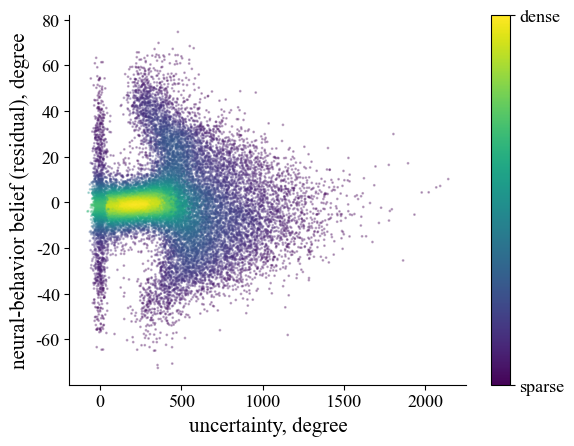

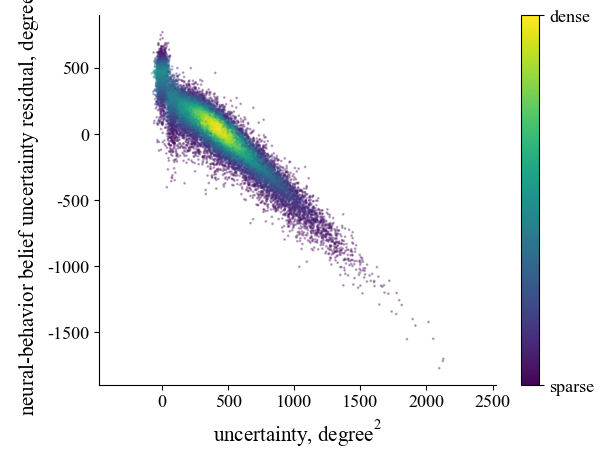

In [27]:

'''
neural belief - behavior belief residuel, vs uncertainty.
the idea is: when neural encoding is noisy, uncertainty is large. the noisyness might be related to the residuel. here the residual is a measurement of neural variance
'''
trialstart=2
uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0] # var
thisx=np.concatenate([a[trialstart:] for a in sessdf.belief_heading]) # behavior blief heading
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
model = LinearRegression()
model.fit(neural_data, thisx)
neural_uncertainty=model.predict(neural_data) # neural belief heading
residual=neural_uncertainty-thisx

fig,ax=plt.subplots(1,1)
scatter_density=compute_scatter_density(uncertainty,(residual))
c=plt.scatter(uncertainty+np.random.randn(*uncertainty.shape)*22,(residual),c=scatter_density, s=1,alpha=0.3)
cbar=plt.colorbar(c)
cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
solidcbar(cbar)
# mask=thisx>0.1
# slope=plot_best_fit(thisx[mask], (thisx-neural_uncertainty)[mask], ax=plt.gca())
# plt.title(f'slope = {slope:.2f}')
plt.xlabel('uncertainty, degree')
plt.ylabel('neural-behavior belief (residual), degree')
# plt.axis('equal')
plt.show()

# fit neural for variance
thisx=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0] # var
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
model = LinearRegression()
model.fit(neural_data, thisx)
neural_uncertainty=model.predict(neural_data) # neural belief uncertainty
residual=neural_uncertainty-thisx

fig,ax=plt.subplots(1,1)
# plt.scatter(uncertainty,np.abs(residual),s=1,alpha=0.3)
scatter_density=compute_scatter_density(uncertainty,(residual))
c=plt.scatter(uncertainty+np.random.randn(*uncertainty.shape)*22,(residual),c=scatter_density, s=1,alpha=0.3)
cbar=plt.colorbar(c)
cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
solidcbar(cbar)
mask=uncertainty>0.0151
# slope=plot_best_fit(uncertainty[mask], np.abs(residual)[mask], ax=plt.gca())
# plt.title(f'slope = {slope:.2f}')
plt.xlabel(r'uncertainty, degree$^2$')
plt.ylabel(r'neural-behavior belief uncertainty residual, degree$^2$')
plt.axis('equal')
plt.show()

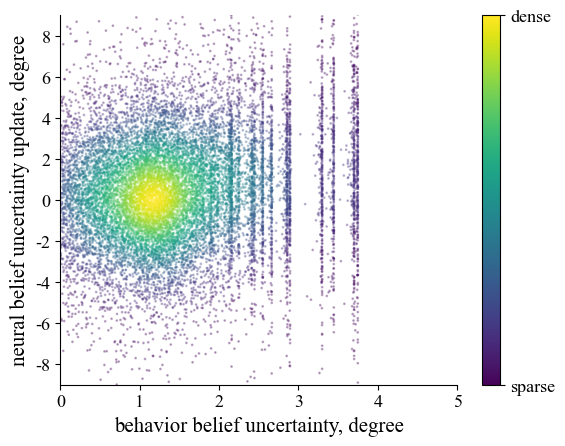

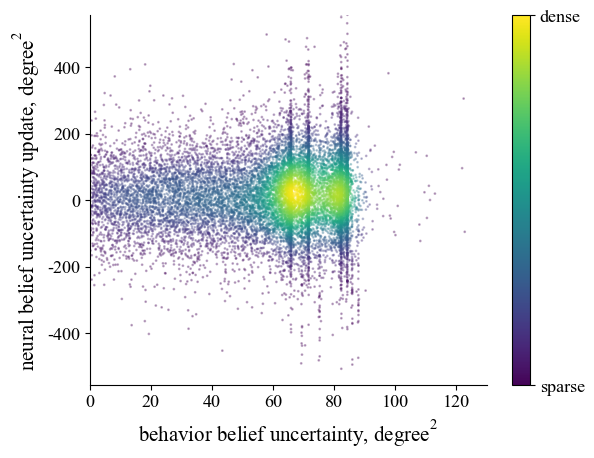

In [28]:

'''
neural belief update, vs uncertainty. no corr. bad result
'''
trialstart=2
# fit neural for std
thisx=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
model = LinearRegression()
model.fit(neural_data, thisx)
# pred=model.predict(neural_data) # neural belief uncertainty
pred=cross_val_predict(model,neural_data,thisx,cv=5)

fig,ax=plt.subplots(1,1)
mask=np.diff(thisx)>0
scatter_density=compute_scatter_density(np.diff(thisx)[mask], np.diff(pred)[mask])
c=plt.scatter(np.diff(thisx)[mask], np.diff(pred)[mask],c=scatter_density, s=1,alpha=0.3)
cbar=plt.colorbar(c)
cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
solidcbar(cbar)
plt.xlabel('behavior belief uncertainty, degree')
plt.ylabel('neural belief uncertainty update, degree')
# plt.axis('equal')
plt.xlim(0,5)
plt.ylim(-9,9)
plt.show()



# fit neural for variance
thisx=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
model = LinearRegression()
model.fit(neural_data, thisx)
pred=model.predict(neural_data) # neural belief uncertainty

fig,ax=plt.subplots(1,1)
mask=np.diff(thisx)>0
scatter_density=compute_scatter_density(np.diff(thisx)[mask], np.diff(pred)[mask])
c=plt.scatter(np.diff(thisx)[mask], np.diff(pred)[mask],c=scatter_density, s=1,alpha=0.3)
cbar=plt.colorbar(c)
cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
solidcbar(cbar)
plt.xlabel(r'behavior belief uncertainty, degree$^2$')
plt.ylabel(r'neural belief uncertainty update, degree$^2$')
plt.xlim(0,130)
plt.ylim(-555,555)
plt.show()

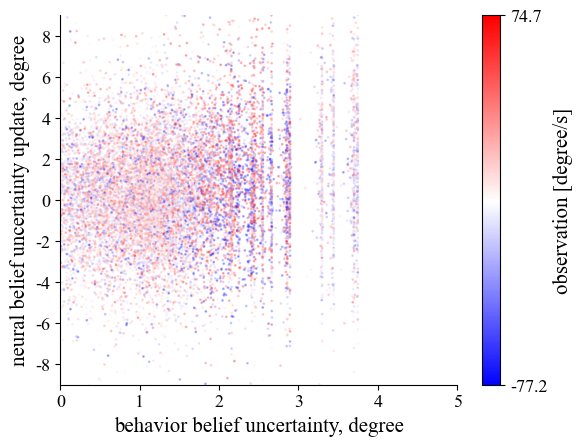

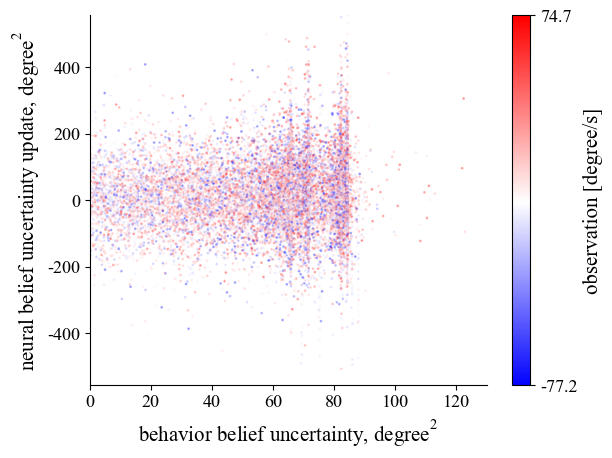

In [29]:

'''
neural belief update, vs uncertainty. color by obs (velocity)
'''
trialstart=2
# fit neural for std
thisx=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
thisc=np.concatenate([a[trialstart:] for a in sessdf.mw.to_numpy()])
model = LinearRegression()
model.fit(neural_data, thisx)
pred=model.predict(neural_data) # neural belief uncertainty

fig,ax=plt.subplots(1,1)
mask=np.diff(thisx)>0
c=plt.scatter(np.diff(thisx)[mask], np.diff(pred)[mask],c=thisc[1:][mask],cmap='bwr', s=1,alpha=0.3)
cbar=plt.colorbar(c, label='observation [degree/s]')
cbar.set_ticks([min(thisc[1:]),max(thisc[1:])])
solidcbar(cbar)
plt.xlabel('behavior belief uncertainty, degree')
plt.ylabel('neural belief uncertainty update, degree')
# plt.axis('equal')
plt.xlim(0,5)
plt.ylim(-9,9)
plt.show()



# fit neural for variance
thisx=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
model = LinearRegression()
model.fit(neural_data, thisx)
pred=model.predict(neural_data) # neural belief uncertainty

fig,ax=plt.subplots(1,1)
mask=np.diff(thisx)>0
c=plt.scatter(np.diff(thisx)[mask], np.diff(pred)[mask],c=thisc[1:][mask],cmap='bwr', s=1,alpha=0.3)
cbar=plt.colorbar(c, label='observation [degree/s]')
cbar.set_ticks([min(thisc[1:]),max(thisc[1:])])
solidcbar(cbar)
plt.xlabel(r'behavior belief uncertainty, degree$^2$')
plt.ylabel(r'neural belief uncertainty update, degree$^2$')
plt.xlim(0,130)
plt.ylim(-555,555)
plt.show()

## variance of neural activity, in a grid of time and uncertainty.

[[0.         0.00714146 0.00269611 0.         0.        ]
 [0.         0.00374655 0.0024992  0.00210939 0.        ]
 [0.         0.00292864 0.00235156 0.0029918  0.00194242]
 [0.         0.00134017 0.00288252 0.00359041 0.00296865]
 [0.         0.         0.         0.         0.0021385 ]]


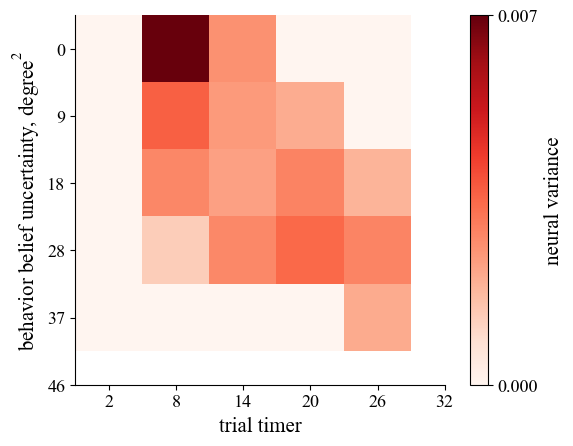

In [30]:
'''
variance of neural activity, in a grid of time and uncertainty.
such that we can read by row and col to seperate uncertainty and time.
'''
trialstart=2
uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5 # std
trial_time=np.concatenate([a[trialstart:] for a in sessdf.timer])
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC.to_numpy()])

# mask=(np.concatenate([a[trialstart:] for a in sessdf.timer])>7)&(np.concatenate([a[trialstart:] for a in sessdf.triallen_t])>2)
mask=(np.concatenate([a[trialstart:] for a in sessdf.triallen_t])>2)

uncertainty, residual, trial_time=uncertainty[mask], residual[mask], trial_time[mask]

n_bins_time, n_bins_uncertainty=6,6
bins_time=np.linspace(np.min(trial_time), np.max(trial_time),n_bins_time)
bins_uncertainty=np.linspace(np.min(uncertainty), np.max(uncertainty),n_bins_uncertainty)
res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))

i_neuron=0
for i in range(n_bins_time-1):
    for j in range(n_bins_uncertainty-1):
        mask=np.where((trial_time > bins_time[i]) & (trial_time < bins_time[i+1]) & (uncertainty > bins_uncertainty[j]) & (uncertainty < bins_uncertainty[j+1]))[0]
        if len(mask)==0: continue
        r=neural_data[:,i_neuron]
        neural_variance=np.var(r[mask])
        res[i,j]=neural_variance
print(res)


fig,ax=plt.subplots(1,1)
c=plt.imshow(res, cmap='Reds')
cbar=plt.colorbar(c, label='neural variance')
cbar.set_ticks([np.min(res),np.max(res)])
cbar.set_ticklabels([f'{a:.3f}' for a in [np.min(res),np.max(res)]])
solidcbar(cbar)
plt.ylabel(r'behavior belief uncertainty, degree$^2$',)
plt.xlabel(r'trial timer')
plt.xticks(list(range(n_bins_time)),[f'{a:.0f}' for a in bins_time])
plt.yticks(list(range(n_bins_uncertainty)),[f'{a:.0f}' for a in bins_uncertainty])
plt.show()

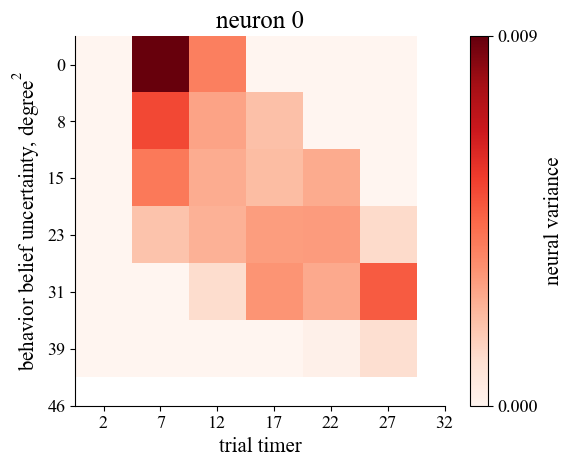

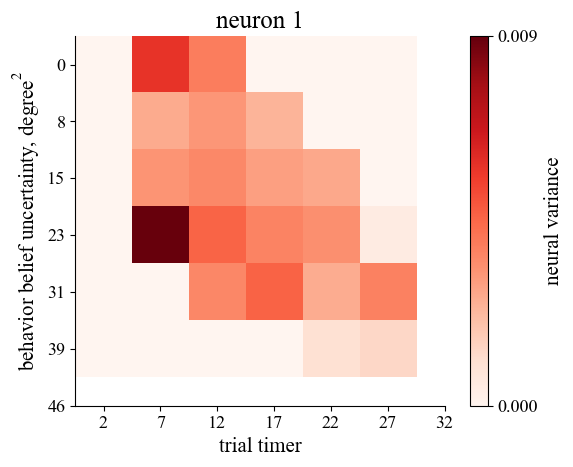

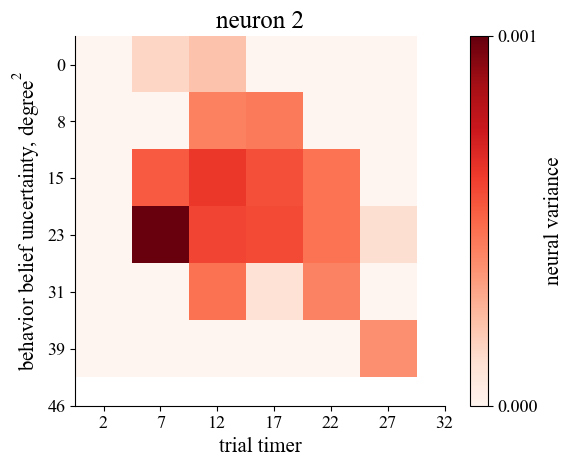

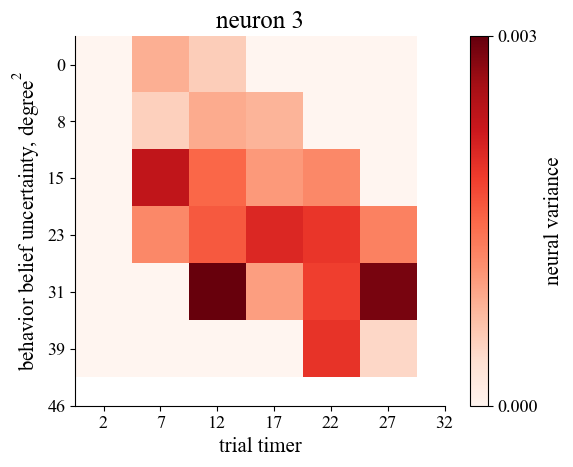

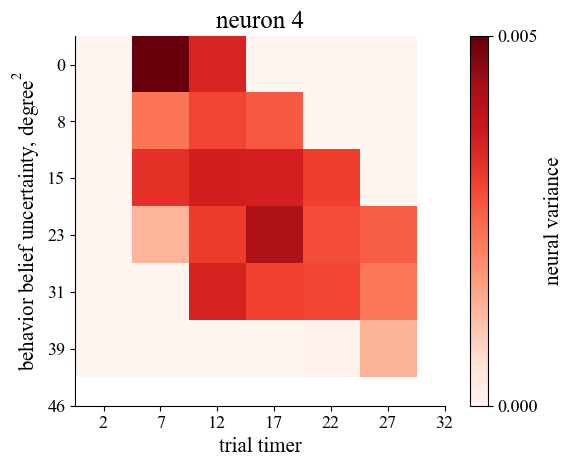

...

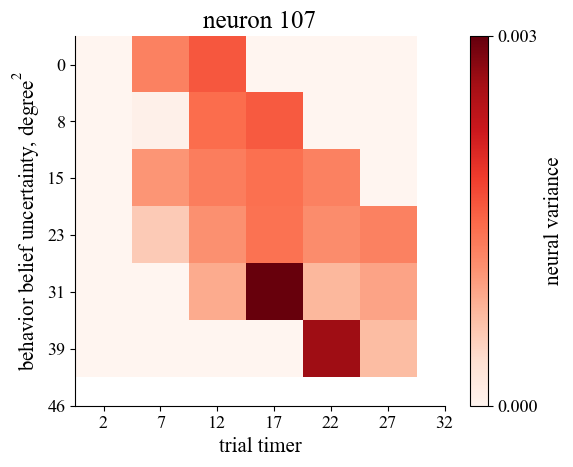

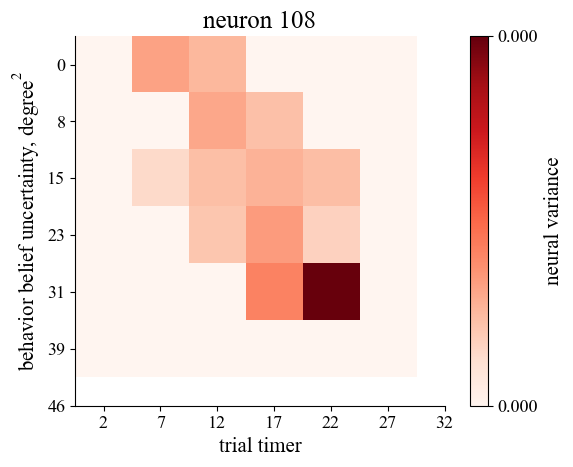

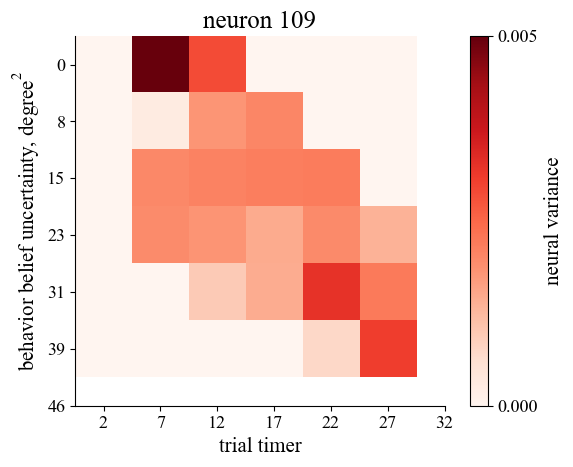

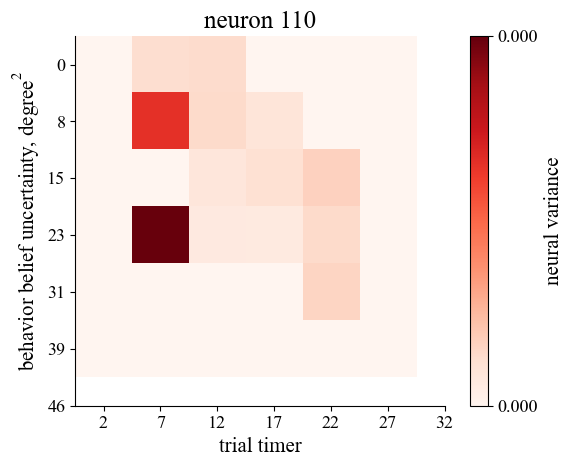

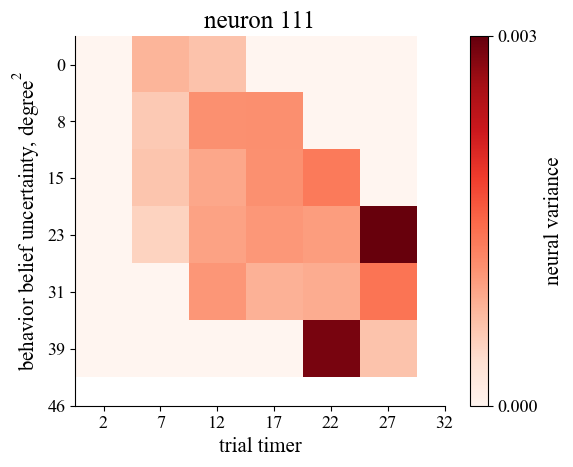

In [31]:
# individual neurons
n_bins_time, n_bins_uncertainty=7,7
bins_time=np.linspace(np.min(trial_time), np.max(trial_time),n_bins_time)
bins_uncertainty=np.linspace(np.min(uncertainty), np.max(uncertainty),n_bins_uncertainty)
res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))

for i_neuron in range(neural_data.shape[1]):
    res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
    for i in range(n_bins_time-1):
        for j in range(n_bins_uncertainty-1):
            mask=np.where((trial_time > bins_time[i]) & (trial_time < bins_time[i+1]) & (uncertainty > bins_uncertainty[j]) & (uncertainty < bins_uncertainty[j+1]))[0]
            if len(mask)==0: continue
            r=neural_data[:,i_neuron]
            neural_variance=np.var(r[mask])
            res[i,j]=neural_variance

    fig,ax=plt.subplots(1,1)
    c=plt.imshow(res, cmap='Reds')
    cbar=plt.colorbar(c, label='neural variance')
    cbar.set_ticks([np.min(res),np.max(res)])
    cbar.set_ticklabels([f'{a:.3f}' for a in [np.min(res),np.max(res)]])
    solidcbar(cbar)
    plt.ylabel(r'behavior belief uncertainty, degree$^2$',)
    plt.xlabel(r'trial timer')
    plt.xticks(list(range(n_bins_time)),[f'{a:.0f}' for a in bins_time])
    plt.yticks(list(range(n_bins_uncertainty)),[f'{a:.0f}' for a in bins_uncertainty])
    plt.title(f'neuron {i_neuron}')
    plt.show()

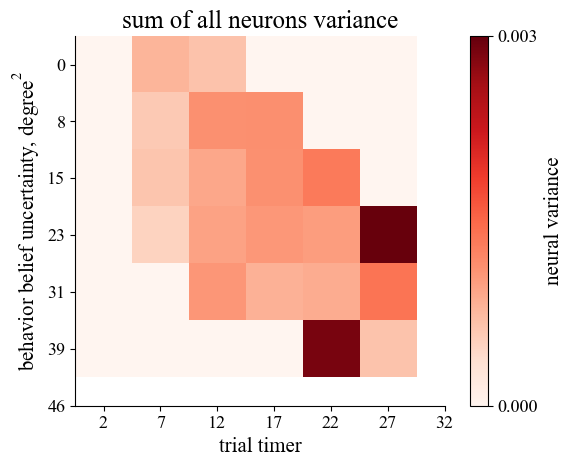

In [32]:
# sum of all individual neurons
n_bins_time, n_bins_uncertainty=7,7
bins_time=np.linspace(np.min(trial_time), np.max(trial_time),n_bins_time)
bins_uncertainty=np.linspace(np.min(uncertainty), np.max(uncertainty),n_bins_uncertainty)
res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))

for i_neuron in range(neural_data.shape[1]):
    # res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
    for i in range(n_bins_time-1):
        for j in range(n_bins_uncertainty-1):
            mask=np.where((trial_time > bins_time[i]) & (trial_time < bins_time[i+1]) & (uncertainty > bins_uncertainty[j]) & (uncertainty < bins_uncertainty[j+1]))[0]
            if len(mask)==0: continue
            r=neural_data[:,i_neuron]
            neural_variance=np.var(r[mask])
            res[i,j]=neural_variance

fig,ax=plt.subplots(1,1)
c=plt.imshow(res, cmap='Reds')
cbar=plt.colorbar(c, label='neural variance')
cbar.set_ticks([np.min(res),np.max(res)])
cbar.set_ticklabels([f'{a:.3f}' for a in [np.min(res),np.max(res)]])
solidcbar(cbar)
plt.ylabel(r'behavior belief uncertainty, degree$^2$',)
plt.xlabel(r'trial timer')
plt.xticks(list(range(n_bins_time)),[f'{a:.0f}' for a in bins_time])
plt.yticks(list(range(n_bins_uncertainty)),[f'{a:.0f}' for a in bins_uncertainty])
plt.title(f'sum of all neurons variance')
plt.show()



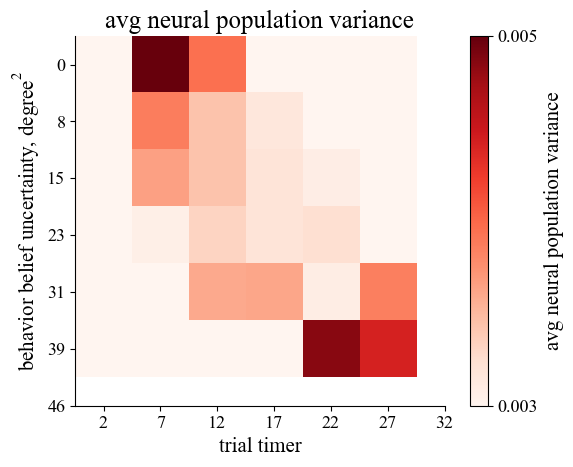

In [33]:
# population variance of neurons
n_bins_time, n_bins_uncertainty=7,7
bins_time=np.linspace(np.min(trial_time), np.max(trial_time),n_bins_time)
bins_uncertainty=np.linspace(np.min(uncertainty), np.max(uncertainty),n_bins_uncertainty)
# res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
res=defaultdict(list) # i,j --> []

for i_neuron in range(neural_data.shape[1]):
    # res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
    for i in range(n_bins_time-1):
        for j in range(n_bins_uncertainty-1):
            mask=np.where((trial_time > bins_time[i]) & (trial_time < bins_time[i+1]) & (uncertainty > bins_uncertainty[j]) & (uncertainty < bins_uncertainty[j+1]))[0]
            if len(mask)==0: continue
            r=neural_data[:,i_neuron]
            # neural_variance=np.var(r[mask])
            res[(i,j)].append(r[mask])


res_=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
for i in range(n_bins_time-1):
    for j in range(n_bins_uncertainty-1):
        this=np.array(res[(i,j)]) # n_neurons, n_cases. we want to take var at 1st dim, and avg in second dim
        if len(this)==0: continue
        caseavg_populationvar=np.mean(np.var(this,axis=0))
        res_[i,j]=caseavg_populationvar

fig,ax=plt.subplots(1,1)
c=plt.imshow(res_, cmap='Reds',vmin=np.min(res_[res_>0]))
cbar=plt.colorbar(c, label='avg neural population variance')
cbar.set_ticks([np.min(res_[res_>0]),np.max(res_)])
cbar.set_ticklabels([f'{a:.3f}' for a in [np.min(res_[res_>0]),np.max(res_)]])
solidcbar(cbar)
plt.ylabel(r'behavior belief uncertainty, degree$^2$',)
plt.xlabel(r'trial timer')
plt.xticks(list(range(n_bins_time)),[f'{a:.0f}' for a in bins_time])
plt.yticks(list(range(n_bins_uncertainty)),[f'{a:.0f}' for a in bins_uncertainty])
plt.title(f'avg neural population variance')
plt.show()


neural activity, (# data point, #neuron)
trial timer, (# data point, 1)
    data point: (# trial, trial length)
uncertainty, (# data point, 1)

trial timer, uncertainty: high corr
! neural activity-->uncertainty

neural activity (fire rate) --> uncertainty, not working
neural activity (population variance) --> uncertainty ? 
neural activity (single neuron temporal variance) --> uncertainty, somewhat work 

pixel: binned time, binned uncertainty. data: neural activity (# data point, # neuron)
(# data point, # neuron)
(# data point, 1)
var(# data point, 1)
(1)

population variance:
(# data point, # neuron)
(1, # neuron)
var(1, # neuron)

## raw neural varaince

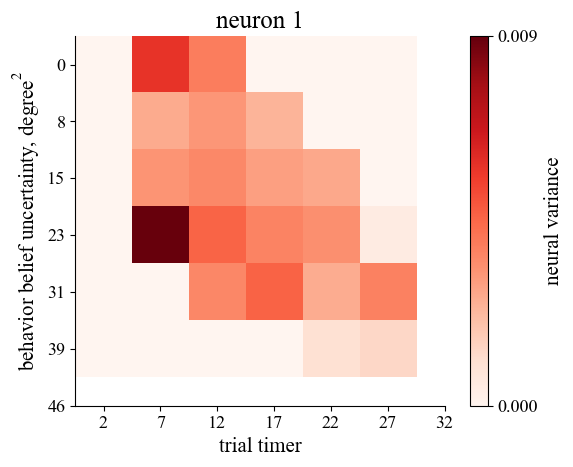

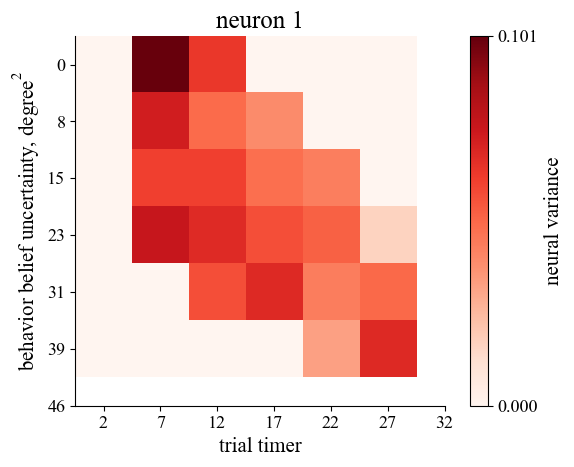

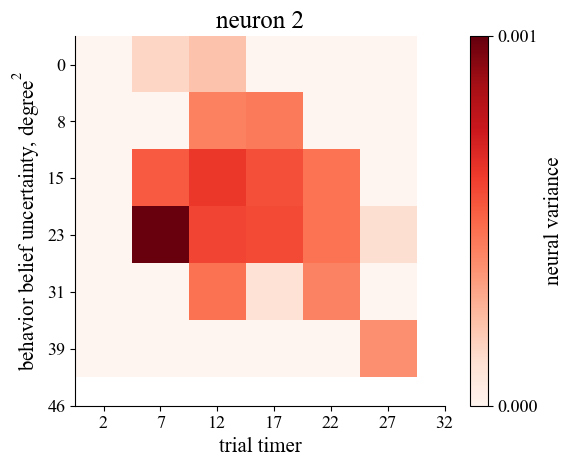

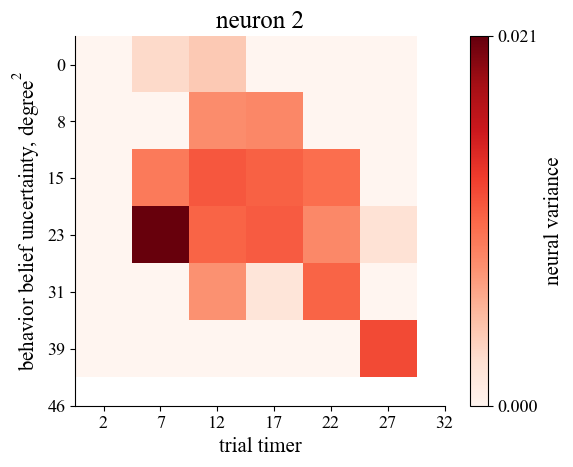

In [34]:
# confirm this is simlar. prev result hold.
trialstart=2
uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5 # std
trial_time=np.concatenate([a[trialstart:] for a in sessdf.timer])
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC.to_numpy()])
neural_var=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])

mask=(np.concatenate([a[trialstart:] for a in sessdf.triallen_t])>2)
uncertainty, residual, trial_time=uncertainty[mask], residual[mask], trial_time[mask]

n_bins_time, n_bins_uncertainty=7,7
bins_time=np.linspace(np.min(trial_time), np.max(trial_time),n_bins_time)
bins_uncertainty=np.linspace(np.min(uncertainty), np.max(uncertainty),n_bins_uncertainty)
res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
resrawvar=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
# for i_neuron in range(neural_data.shape[1]):
for i_neuron in [1,2]:
    res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
    for i in range(n_bins_time-1):
        for j in range(n_bins_uncertainty-1):
            mask=np.where((trial_time > bins_time[i]) & (trial_time < bins_time[i+1]) & (uncertainty > bins_uncertainty[j]) & (uncertainty < bins_uncertainty[j+1]))[0]
            if len(mask)==0: continue
            r=neural_data[:,i_neuron]
            neural_variance=np.var(r[mask])
            res[i,j]=neural_variance

            rvar=neural_var[:,i_neuron]
            neural_variance=np.mean(r[mask])
            resrawvar[i,j]=neural_variance
            

    fig,ax=plt.subplots(1,1)
    c=plt.imshow(res, cmap='Reds')
    cbar=plt.colorbar(c, label='neural variance')
    cbar.set_ticks([np.min(res),np.max(res)])
    cbar.set_ticklabels([f'{a:.3f}' for a in [np.min(res),np.max(res)]])
    solidcbar(cbar)
    plt.ylabel(r'behavior belief uncertainty, degree$^2$',)
    plt.xlabel(r'trial timer')
    plt.xticks(list(range(n_bins_time)),[f'{a:.0f}' for a in bins_time])
    plt.yticks(list(range(n_bins_uncertainty)),[f'{a:.0f}' for a in bins_uncertainty])
    plt.title(f'neuron {i_neuron}')
    plt.show()


    fig,ax=plt.subplots(1,1)
    c=plt.imshow(resrawvar, cmap='Reds')
    cbar=plt.colorbar(c, label='neural variance')
    cbar.set_ticks([np.min(resrawvar),np.max(resrawvar)])
    cbar.set_ticklabels([f'{a:.3f}' for a in [np.min(resrawvar),np.max(resrawvar)]])
    solidcbar(cbar)
    plt.ylabel(r'behavior belief uncertainty, degree$^2$',)
    plt.xlabel(r'trial timer')
    plt.xticks(list(range(n_bins_time)),[f'{a:.0f}' for a in bins_time])
    plt.yticks(list(range(n_bins_uncertainty)),[f'{a:.0f}' for a in bins_uncertainty])
    plt.title(f'neuron {i_neuron}')
    plt.show()

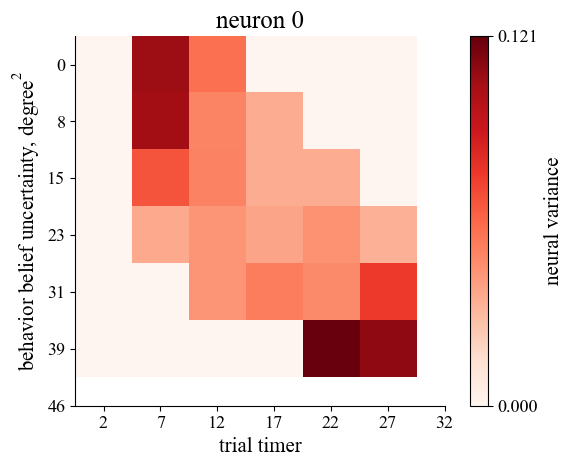

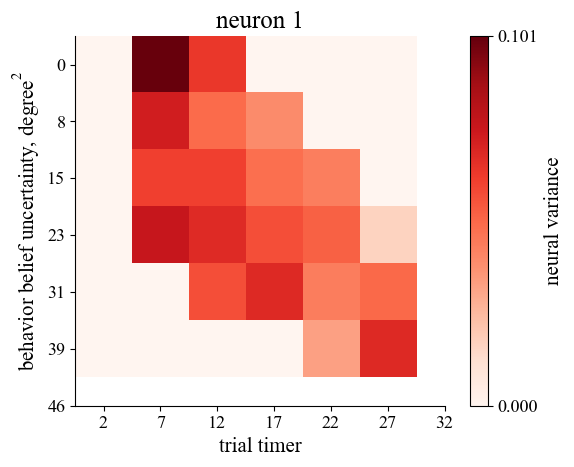

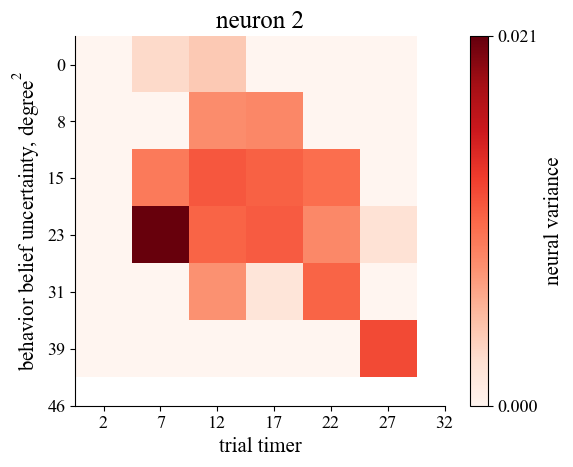

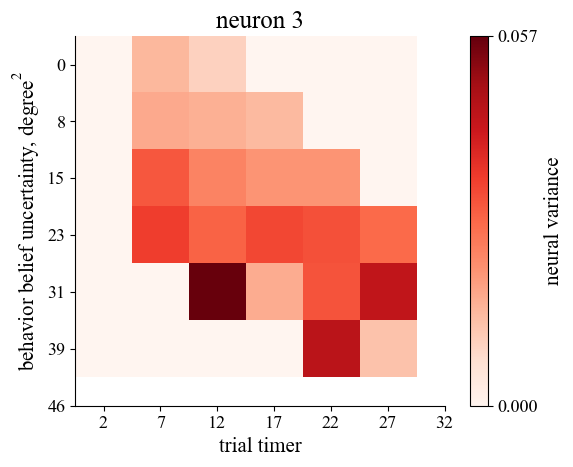

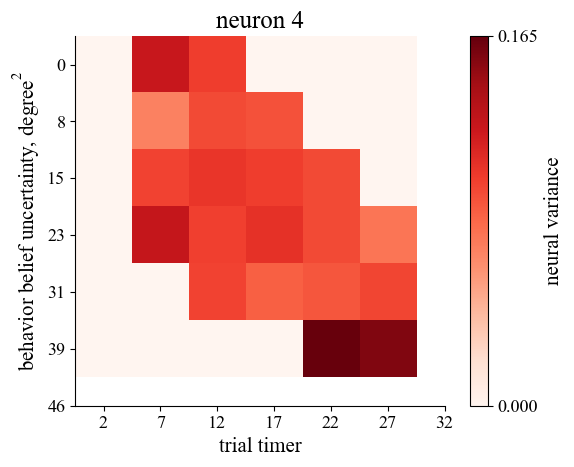

...

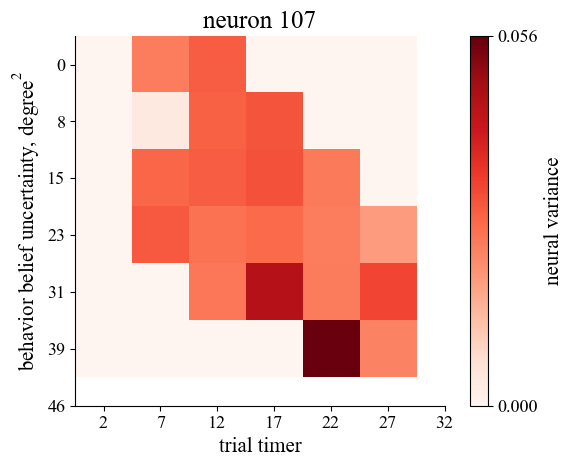

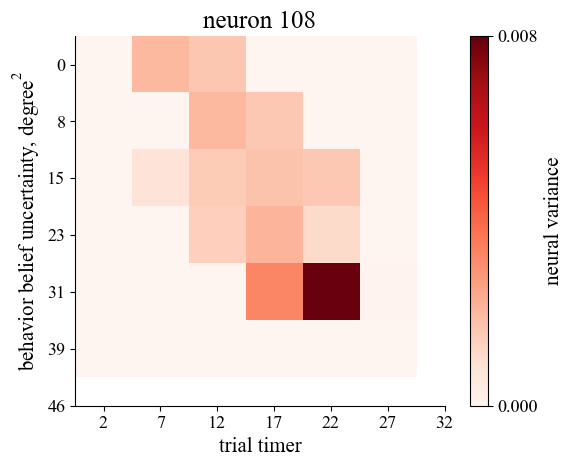

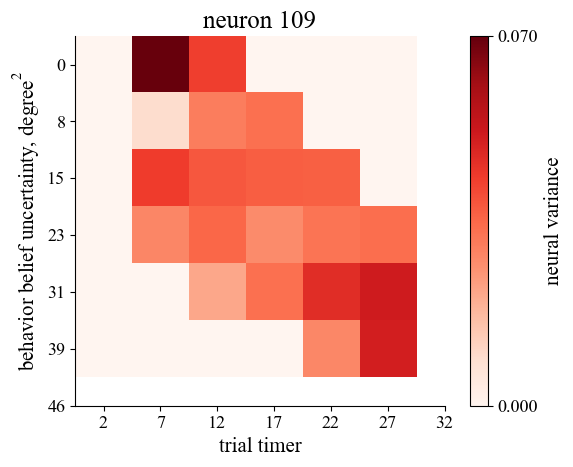

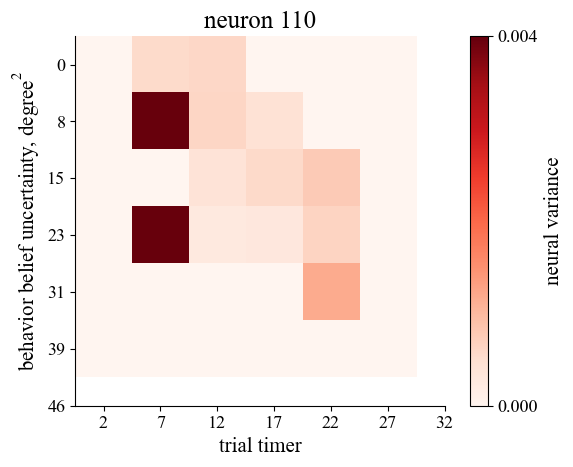

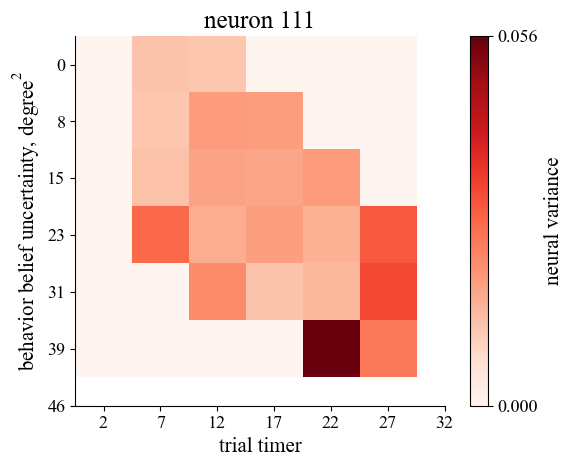

In [35]:
# use raw var
trialstart=2
uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5 # std
trial_time=np.concatenate([a[trialstart:] for a in sessdf.timer])
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC.to_numpy()])
neural_var=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])

mask=(np.concatenate([a[trialstart:] for a in sessdf.triallen_t])>2)
uncertainty, residual, trial_time=uncertainty[mask], residual[mask], trial_time[mask]

n_bins_time, n_bins_uncertainty=7,7
bins_time=np.linspace(np.min(trial_time), np.max(trial_time),n_bins_time)
bins_uncertainty=np.linspace(np.min(uncertainty), np.max(uncertainty),n_bins_uncertainty)
res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
resrawvar=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
for i_neuron in range(neural_data.shape[1]):
# for i_neuron in [1,2]:
    res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
    for i in range(n_bins_time-1):
        for j in range(n_bins_uncertainty-1):
            mask=np.where((trial_time > bins_time[i]) & (trial_time < bins_time[i+1]) & (uncertainty > bins_uncertainty[j]) & (uncertainty < bins_uncertainty[j+1]))[0]
            if len(mask)==0: continue
            r=neural_data[:,i_neuron]
            neural_variance=np.var(r[mask])
            res[i,j]=neural_variance

            rvar=neural_var[:,i_neuron]
            neural_variance=np.mean(r[mask])
            resrawvar[i,j]=neural_variance
            
    fig,ax=plt.subplots(1,1)
    c=plt.imshow(resrawvar, cmap='Reds')
    cbar=plt.colorbar(c, label='neural variance')
    cbar.set_ticks([np.min(resrawvar),np.max(resrawvar)])
    cbar.set_ticklabels([f'{a:.3f}' for a in [np.min(resrawvar),np.max(resrawvar)]])
    solidcbar(cbar)
    plt.ylabel(r'behavior belief uncertainty, degree$^2$',)
    plt.xlabel(r'trial timer')
    plt.xticks(list(range(n_bins_time)),[f'{a:.0f}' for a in bins_time])
    plt.yticks(list(range(n_bins_uncertainty)),[f'{a:.0f}' for a in bins_uncertainty])
    plt.title(f'neuron {i_neuron}')
    plt.show()

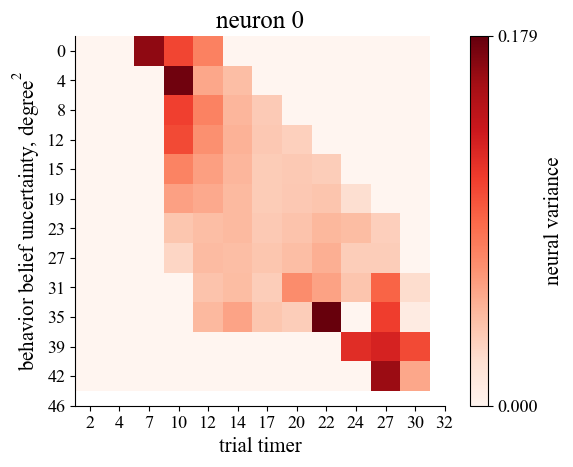

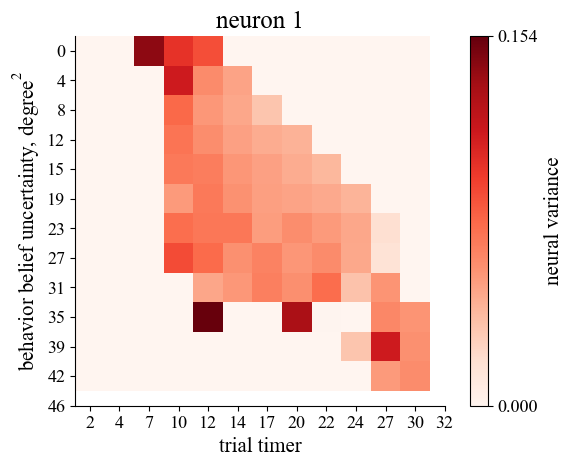

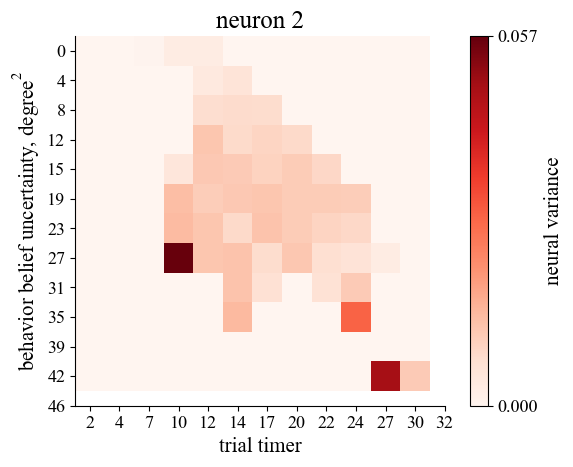

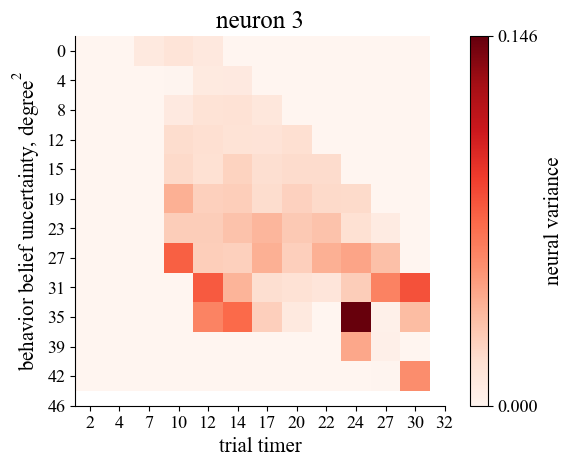

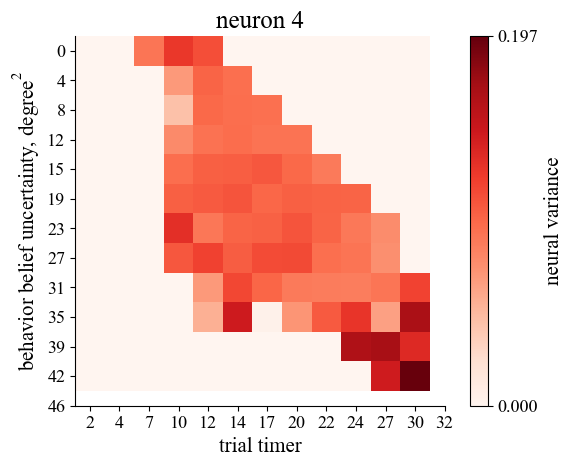

...

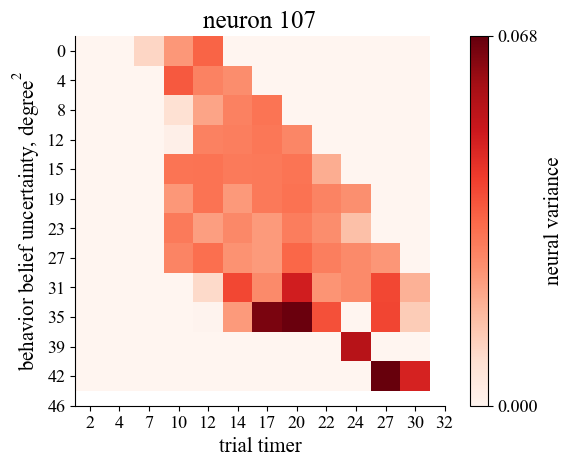

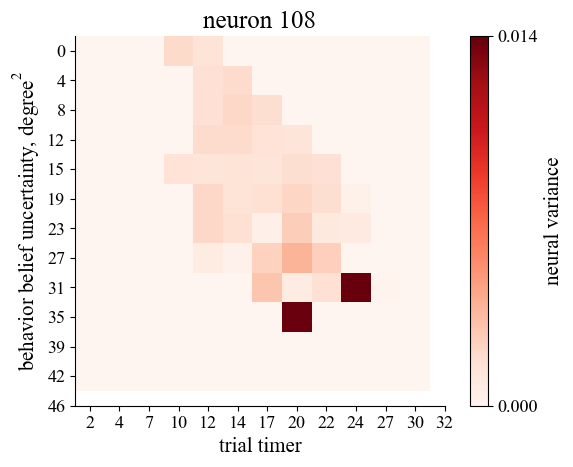

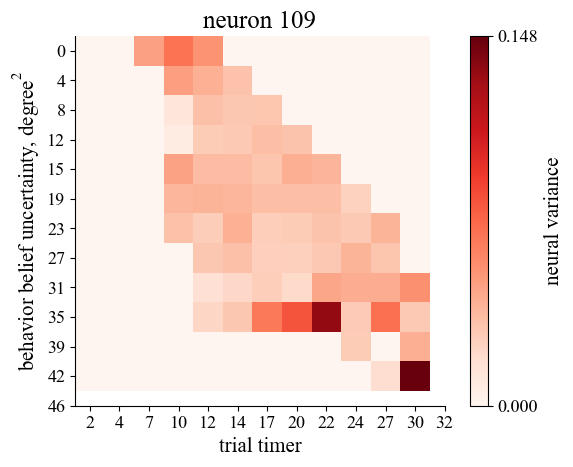

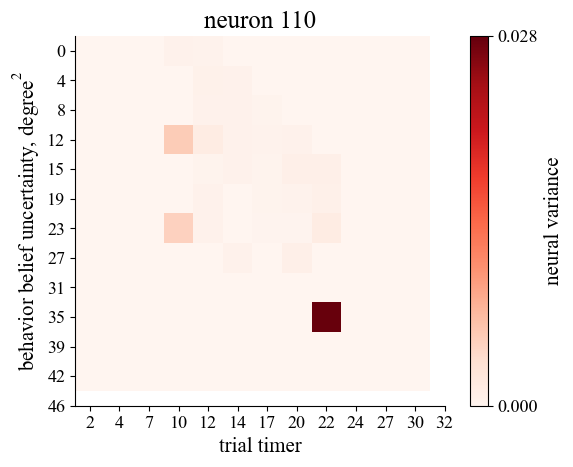

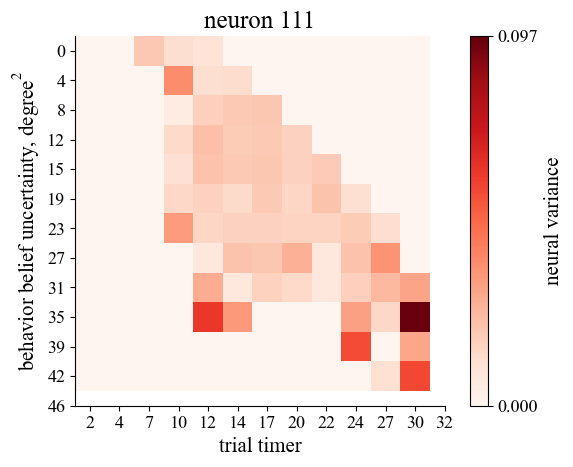

In [36]:
# use raw var
trialstart=2
uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5 # std
trial_time=np.concatenate([a[trialstart:] for a in sessdf.timer])
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC.to_numpy()])
neural_var=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])

mask=(np.concatenate([a[trialstart:] for a in sessdf.triallen_t])>2)
uncertainty, residual, trial_time=uncertainty[mask], residual[mask], trial_time[mask]

n_bins_time, n_bins_uncertainty=13,13
bins_time=np.linspace(np.min(trial_time), np.max(trial_time),n_bins_time)
bins_uncertainty=np.linspace(np.min(uncertainty), np.max(uncertainty),n_bins_uncertainty)
res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
resrawvar=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
for i_neuron in range(neural_data.shape[1]):
# for i_neuron in [1,2]:
    res=np.zeros((n_bins_time-1, n_bins_uncertainty-1))
    for i in range(n_bins_time-1):
        for j in range(n_bins_uncertainty-1):
            mask=np.where((trial_time > bins_time[i]) & (trial_time < bins_time[i+1]) & (uncertainty > bins_uncertainty[j]) & (uncertainty < bins_uncertainty[j+1]))[0]
            if len(mask)==0: continue
            r=neural_data[:,i_neuron]
            neural_variance=np.var(r[mask])
            res[i,j]=neural_variance

            rvar=neural_var[:,i_neuron]
            neural_variance=np.mean(r[mask])
            resrawvar[i,j]=neural_variance
            
    fig,ax=plt.subplots(1,1)
    c=plt.imshow(resrawvar, cmap='Reds')
    cbar=plt.colorbar(c, label='neural variance')
    cbar.set_ticks([np.min(resrawvar),np.max(resrawvar)])
    cbar.set_ticklabels([f'{a:.3f}' for a in [np.min(resrawvar),np.max(resrawvar)]])
    solidcbar(cbar)
    plt.ylabel(r'behavior belief uncertainty, degree$^2$',)
    plt.xlabel(r'trial timer')
    plt.xticks(list(range(n_bins_time)),[f'{a:.0f}' for a in bins_time])
    plt.yticks(list(range(n_bins_uncertainty)),[f'{a:.0f}' for a in bins_uncertainty])
    plt.title(f'neuron {i_neuron}')
    plt.show()

## together regression
for each pixel col (one neuron), we learn how to predict the uncertainty from neural activity variance.
we can group all neurons, to predict the uncertainty (and time?)

(11551, 112) (11551,)


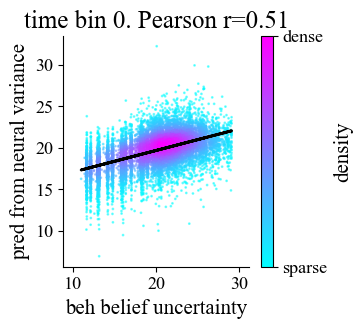

(5140, 112) (5140,)


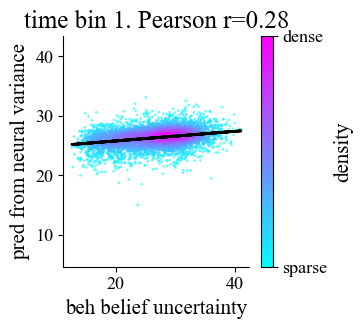

(104, 112) (104,)


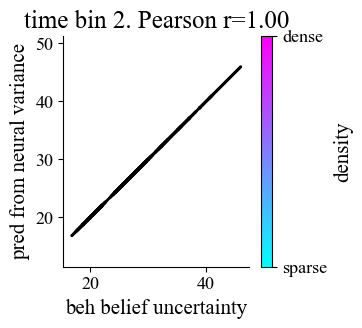

In [37]:
trialstart=2
uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5 # std
trial_time=np.concatenate([a[trialstart:] for a in sessdf.timer])
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC.to_numpy()])
neural_var=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])

mask=(np.concatenate([a[trialstart:] for a in sessdf.triallen_t])>2)
uncertainty, residual, trial_time=uncertainty[mask], residual[mask], trial_time[mask]

n_bins_time, n_bins_uncertainty=4,7
bins_time=np.linspace(np.min(trial_time), np.max(trial_time),n_bins_time)
bins_uncertainty=np.linspace(np.min(uncertainty), np.max(uncertainty),n_bins_uncertainty)
# res=np.zeros((neural_data.shape[1], n_bins_time-1, n_bins_uncertainty-1)) # ineuron, time, uncertainty: neural variance.

# for i_neuron in range(neural_data.shape[1]):
for i in range(n_bins_time-1):
    thisx=[] # neural variance. shape: (timebin, n, n_neuron)
    thisy=[] # beh uncertainty. shape: (timebin, n,1)
    
    for j in range(n_bins_uncertainty-1):
        mask=np.where((trial_time > bins_time[i]) & (trial_time < bins_time[i+1]) & (uncertainty > bins_uncertainty[j]) & (uncertainty < bins_uncertainty[j+1]))[0]
        if len(mask)==0: continue
        thisx.append(neural_var[mask])
        # thisy.append([bins_uncertainty[j]]*len(neural_variance))
        thisy.append(uncertainty[mask])
        # thisy.append(trial_time[mask])

    thisx=np.concatenate(thisx)
    thisy=np.concatenate(thisy)
    print(thisx.shape, thisy.shape)
    # # resshape: ineuron, time, uncertainty: neural variance.
    # # use ineuron dim as feature, select 1 time bin, predict uncertainty
    # for i in range(n_bins_time-1):
    model = LinearRegression()
    model.fit(thisx,thisy)
    thispred=model.predict(thisx)
    # thispred = cross_val_predict(model, thisx, thisy, cv=5)

    # plt.scatter(thisy, thispred, s=1)
    # # slope=plot_best_fit(thisy, thispred, plt.gca())
    # # plt.axis('equal')
    # # plt.title(f'{slope}')
    # corr=pearsonr(thisy, thispred)[0]
    # plt.title(f'time bin {i}. corr={corr:.2f}')
    # plt.ylabel('pred from neural variance')
    # plt.xlabel('beh belief uncertainty')
    # plt.show()

    scatter_density=compute_scatter_density(thispred,thisy)
    fig, ax = plt.subplots(figsize=(3,3))
    c=ax.scatter(thisy,thispred, c=scatter_density, cmap='cool', s=1, alpha=0.5)
    cbar=plt.colorbar(c, label=f'density', ticks=[0,1])
    cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
    solidcbar(cbar)
    slope=plot_best_fit(thisy,thispred, ax)
    r,_=pearsonr(thisy, thispred)
    # ax.set_title(f'Pearson r: {r:.2f}')
    plt.ylabel('pred from neural variance')
    plt.xlabel('beh belief uncertainty')
    plt.title(f'time bin {i}. Pearson r={r:.2f}')
    ax.axis('equal')
    plt.show()

(11551, 112) (11551,)


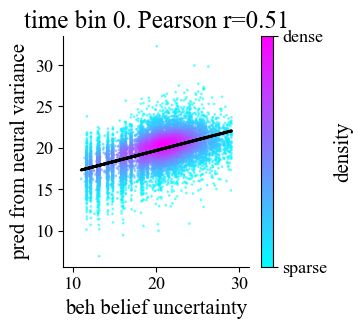

(5140, 112) (5140,)


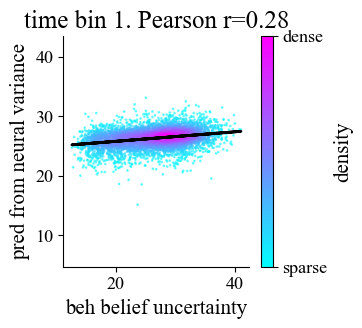

(104, 112) (104,)


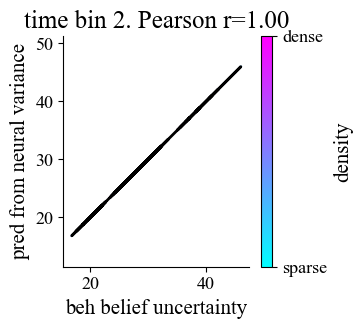

In [38]:
trialstart=2
uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5 # std
trial_time=np.concatenate([a[trialstart:] for a in sessdf.timer])
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC.to_numpy()])
neural_var=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])

mask=(np.concatenate([a[trialstart:] for a in sessdf.triallen_t])>2)
uncertainty, residual, trial_time=uncertainty[mask], residual[mask], trial_time[mask]

n_bins_time, n_bins_uncertainty=4,5
bins_time=np.linspace(np.min(trial_time), np.max(trial_time),n_bins_time)
bins_uncertainty=np.linspace(np.min(uncertainty), np.max(uncertainty),n_bins_uncertainty)
# res=np.zeros((neural_data.shape[1], n_bins_time-1, n_bins_uncertainty-1)) # ineuron, time, uncertainty: neural variance.

# for i_neuron in range(neural_data.shape[1]):
for i in range(n_bins_time-1):
    thisx=[] # neural variance. shape: (timebin, n, n_neuron)
    thisy=[] # beh uncertainty. shape: (timebin, n,1)
    
    for j in range(n_bins_uncertainty-1):
        mask=np.where((trial_time > bins_time[i]) & (trial_time < bins_time[i+1]) & (uncertainty > bins_uncertainty[j]) & (uncertainty < bins_uncertainty[j+1]))[0]
        if len(mask)==0: continue
        thisx.append(neural_var[mask])
        # thisy.append([bins_uncertainty[j]]*len(neural_variance))
        thisy.append(uncertainty[mask])
        # thisy.append(trial_time[mask])

    thisx=np.concatenate(thisx)
    thisy=np.concatenate(thisy)
    print(thisx.shape, thisy.shape)
    # # resshape: ineuron, time, uncertainty: neural variance.
    # # use ineuron dim as feature, select 1 time bin, predict uncertainty
    # for i in range(n_bins_time-1):

    
    pca = PCA(n_components=min(thisx.shape[0], thisx.shape[1]) - 1)
    thisx_reduced = pca.fit_transform(thisx)

    # # # Create and fit the Lasso model
    # model = Lasso(alpha=0.1)
    # model.fit(thisx_reduced, thisy)

    # # # Predict using the model
    # thispred = model.predict(thisx_reduced)

    model = LinearRegression()
    model.fit(thisx_reduced,thisy)
    thispred=model.predict(thisx_reduced)
    # thispred = cross_val_predict(model, thisx_reduced, thisy, cv=5)

    # plt.scatter(thisy, thispred, s=1)
    # # slope=plot_best_fit(thisy, thispred, plt.gca())
    # # plt.axis('equal')
    # # plt.title(f'{slope}')
    # corr=pearsonr(thisy, thispred)[0]
    # plt.title(f'time bin {i}. corr={corr:.2f}')
    # plt.ylabel('pred from neural variance')
    # plt.xlabel('beh belief uncertainty')
    # plt.show()

    scatter_density=compute_scatter_density(thispred,thisy)
    fig, ax = plt.subplots(figsize=(3,3))
    c=ax.scatter(thisy,thispred, c=scatter_density, cmap='cool', s=1, alpha=0.5)
    cbar=plt.colorbar(c, label=f'density', ticks=[0,1])
    cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
    solidcbar(cbar)
    slope=plot_best_fit(thisy,thispred, ax)
    r,_=pearsonr(thisy,thispred)
    # ax.set_title(f'Pearson r: {r:.2f}')
    plt.ylabel('pred from neural variance')
    plt.xlabel('beh belief uncertainty')
    plt.title(f'time bin {i}. Pearson r={r:.2f}')
    ax.axis('equal')
    plt.show()

(2176, 112) (2176,)


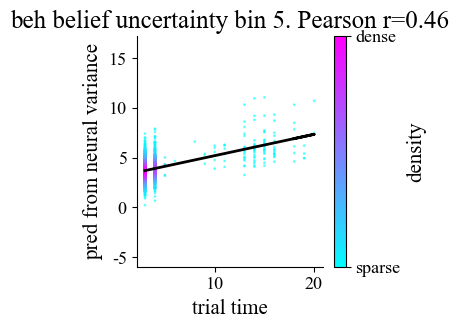

(11635, 112) (11635,)


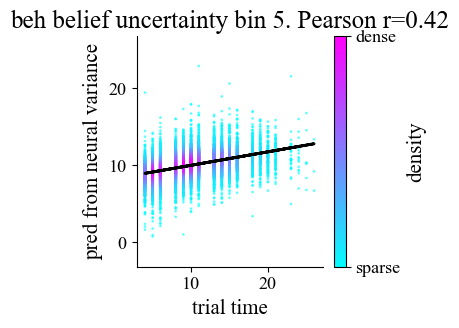

(1065, 112) (1065,)


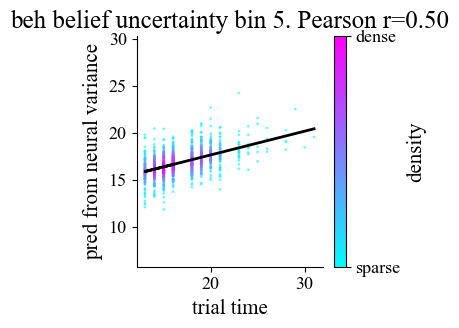

In [39]:
trialstart=2
uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5 # std
trial_time=np.concatenate([a[trialstart:] for a in sessdf.timer])
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC.to_numpy()])
neural_var=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])

mask=(np.concatenate([a[trialstart:] for a in sessdf.triallen_t])>2)
uncertainty, residual, trial_time=uncertainty[mask], residual[mask], trial_time[mask]

n_bins_time, n_bins_uncertainty=7,4
bins_time=np.linspace(np.min(trial_time), np.max(trial_time),n_bins_time)
bins_uncertainty=np.linspace(np.min(uncertainty), np.max(uncertainty),n_bins_uncertainty)
# res=np.zeros((neural_data.shape[1], n_bins_time-1, n_bins_uncertainty-1)) # ineuron, time, uncertainty: neural variance.

# for i_neuron in range(neural_data.shape[1]):
for j in range(n_bins_uncertainty-1):
    thisx=[]
    thisy=[] 
    for i in range(n_bins_time-1):
        mask=np.where((trial_time > bins_time[i]) & (trial_time < bins_time[i+1]) & (uncertainty > bins_uncertainty[j]) & (uncertainty < bins_uncertainty[j+1]))[0]
        if len(mask)==0: continue
        thisx.append(neural_var[mask])
        thisy.append(trial_time[mask])
    if len(thisx)==0:continue
    thisx=np.concatenate(thisx)
    thisy=np.concatenate(thisy)
    print(thisx.shape, thisy.shape)
    # # resshape: ineuron, time, uncertainty: neural variance.
    # # use ineuron dim as feature, select 1 time bin, predict uncertainty
    # for i in range(n_bins_time-1):
    model = LinearRegression()
    model.fit(thisx,thisy)
    thispred=model.predict(thisx)
    # thispred=cross_val_predict(model,thisx,thisy,cv=5)


    # plt.scatter(thisy, thispred, s=1)
    # # slope=plot_best_fit(thisy, thispred, plt.gca())
    # # plt.axis('equal')
    # # plt.title(f'{slope}')
    # corr=pearsonr(thisy, thispred)[0]
    # plt.title(f'uncertainty bin {j}. corr={corr:.2f}')
    # plt.ylabel('pred from neural variance')
    # plt.xlabel('trial time')
    # plt.show()
    scatter_density=compute_scatter_density(thispred,thisy)
    fig, ax = plt.subplots(figsize=(3,3))
    c=ax.scatter(thisy,thispred, c=scatter_density, cmap='cool', s=1, alpha=0.5)
    cbar=plt.colorbar(c, label=f'density', ticks=[0,1])
    cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
    solidcbar(cbar)
    slope=plot_best_fit(thisy,thispred, ax)
    r,_=pearsonr(thisy,thispred)
    # ax.set_title(f'Pearson r: {r:.2f}')
    plt.ylabel('pred from neural variance')
    plt.xlabel('trial time')
    plt.title(f'beh belief uncertainty bin {i}. Pearson r={r:.2f}')
    ax.axis('equal')
    plt.show()

In [40]:
# # neural sampling code trianing
# import torch
# import torch.optim as optim
# from torch.distributions import Normal


# def encoding_function(r, s):
#     '''s: scalar.
#     r: neural activity
#     return the neural encoded belief.'''
#     return s*r

# def expected_value(mu, sigma, z):
#     dist_posterior = Normal(mu, sigma)  # Posterior distribution
#     return torch.exp(dist_posterior.log_prob(z))  # Expected value of encoding under posterior

# def loss_function(params, mu_data, sigma_data, r_obs):
#     loss = 0
#     for t in range(len(mu_data)):
#         mu_t, sigma_t = mu_data[t], sigma_data[t]
#         # Predict the neural response for each encoding function
#         r_pred = torch.stack([expected_value(mu_t, sigma_t, z) for z in params])
#         # Calculate the squared error loss for this time point
#         loss += torch.sum((r_obs[t] - r_pred) ** 2)
#     return loss

# def get_mini_batches(data_size, batch_size):
#     indices = torch.randperm(data_size)  # Shuffle data indices
#     for i in range(0, data_size, batch_size):
#         yield indices[i:i + batch_size] 

# batch_size = 1000
# mu_data=(np.concatenate(sessdf.belief_heading.to_numpy()))
# sigma_data=np.concatenate([a for a in sessdf.relcov.to_numpy()])[:,0,0]
# r_obs=np.concatenate([a for a in sessdf.PPC.to_numpy()])
# mu_data, sigma_data, r_obs = torch.tensor(mu_data), torch.tensor(sigma_data), torch.tensor(r_obs)
# # mu_data, sigma_data, r_obs = mu_data[:1000], sigma_data[:1000], r_obs[:1000]
# initial_params = torch.randn(r_obs.shape[1], requires_grad=True)
# optimizer = optim.Adam([initial_params], lr=0.01)

# n_epochs = 20
# for epoch in range(n_epochs):
#     i=0
#     epoch_loss = 0
#     for batch_idx in get_mini_batches(len(mu_data), batch_size):
#         optimizer.zero_grad()  # Zero out previous gradients
#         # Compute the loss
#         mu_batch = mu_data[batch_idx]
#         sigma_batch = sigma_data[batch_idx]
#         r_obs_batch = r_obs[batch_idx]
#         loss = loss_function(initial_params, mu_batch, sigma_batch, r_obs_batch)    
#         # Perform backpropagation
#         loss.backward()    
#         # Update parameters
#         optimizer.step()
#         # print(f'batch {i}, Loss: {loss.item()/batch_size:.2f}')
#         i+=1
#         epoch_loss += loss.item()
#     print(f'Epoch {epoch}/{n_epochs}, Loss: {loss.item():.2f}')

# # Optimized parameters (encoding centers and widths)
# optimal_params = initial_params.detach().numpy()


## update

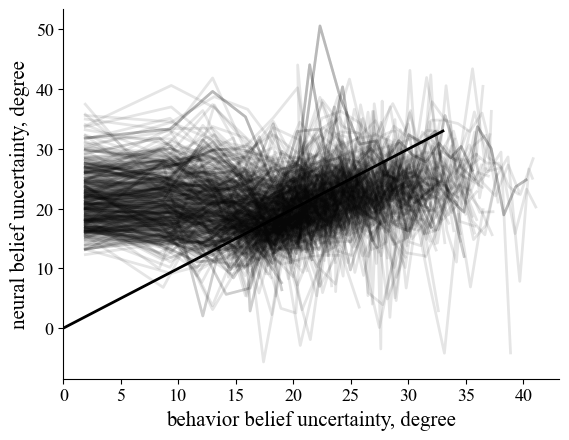

In [52]:
# line connection each trial data
thisx, thisy=np.concatenate([a[1:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[1:] for a in sessdf.mw.to_numpy()]) # std
thisy=np.abs(thisy)
neural_data=np.concatenate([a[1:] for a in sessdf.PPC_var.to_numpy()])

model = LinearRegression()
model.fit(neural_data, thisx)
# pred=model.predict(neural_data) # neural belief uncertainty

fig,ax=plt.subplots(1,1)
for _ in range(555):
    trialdf=sessdf[sessdf.trial==np.random.choice(sessdf.trial.unique())]
    # fit neural for std
    neural_data=np.concatenate([a[1:] for a in trialdf.PPC_var.to_numpy()])
    thisx, thisy=np.concatenate([a[1:] for a in trialdf.relcov.to_numpy()])[:,0,0]**0.5, np.concatenate([a[1:] for a in trialdf.mw.to_numpy()]) # std
    thisy=np.abs(thisy)

    pred=cross_val_predict(model, neural_data, thisx)

    c=plt.plot(thisx, pred, color='k', alpha=0.1)


plt.plot([0,33],[0,33],'k')
plt.xlabel('behavior belief uncertainty, degree')
plt.ylabel('neural belief uncertainty, degree')
# plt.axis('equal')
plt.xlim(0,None)
plt.show()

# # fit neural for variance
# thisx=np.concatenate([a[1:] for a in trialdf.relcov.to_numpy()])[:,0,0] # var
# neural_data=np.concatenate([a[1:] for a in trialdf.PPC_var.to_numpy()])
# model = LinearRegression()
# model.fit(neural_data, thisx)
# # pred=model.predict(neural_data) # neural belief uncertainty
# pred=cross_val_predict(model, neural_data, thisx)
# scatter_density=compute_scatter_density(thisx, pred)


# fig,ax=plt.subplots(1,1)
# c=plt.scatter(thisx+np.random.randn(*thisx.shape)*0.5,pred,c=scatter_density, s=1,alpha=0.3)
# cbar=plt.colorbar(c)
# cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
# solidcbar(cbar)
# plt.xlabel(r'behavior belief uncertainty, degree$^2$')
# plt.ylabel(r'neural belief uncertainty, degree$^2$')
# plt.axis('equal')
# plt.show()

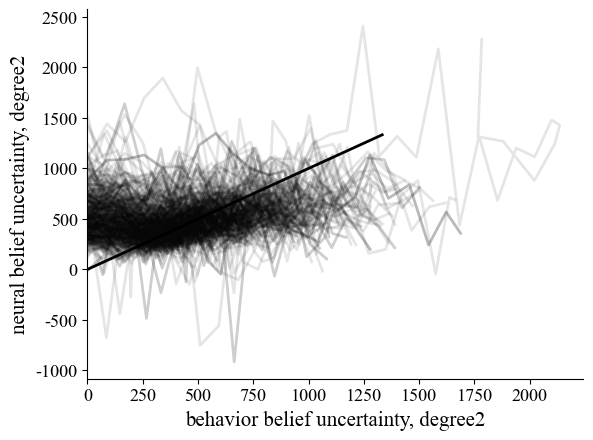

In [53]:
# line connection each trial data
thisx, thisy=np.concatenate([a[1:] for a in sessdf.relcov.to_numpy()])[:,0,0], np.concatenate([a[1:] for a in sessdf.mw.to_numpy()]) 
thisy=np.abs(thisy)
neural_data=np.concatenate([a[1:] for a in sessdf.PPC_var.to_numpy()])

model = LinearRegression()
model.fit(neural_data, thisx)
# pred=model.predict(neural_data) # neural belief uncertainty

fig,ax=plt.subplots(1,1)
for _ in range(555):
    trialdf=sessdf[sessdf.trial==np.random.choice(sessdf.trial.unique())]
    # fit neural for std
    neural_data=np.concatenate([a[1:] for a in trialdf.PPC_var.to_numpy()])
    thisx, thisy=np.concatenate([a[1:] for a in trialdf.relcov.to_numpy()])[:,0,0], np.concatenate([a[1:] for a in trialdf.mw.to_numpy()]) # std
    thisy=np.abs(thisy)

    pred=cross_val_predict(model, neural_data, thisx)

    c=plt.plot(thisx, pred, color='k', alpha=0.1)


plt.plot([0,1333],[0,1333],'k')
plt.xlabel('behavior belief uncertainty, degree2')
plt.ylabel('neural belief uncertainty, degree2')
# plt.axis('equal')
plt.xlim(0,None)
plt.show()

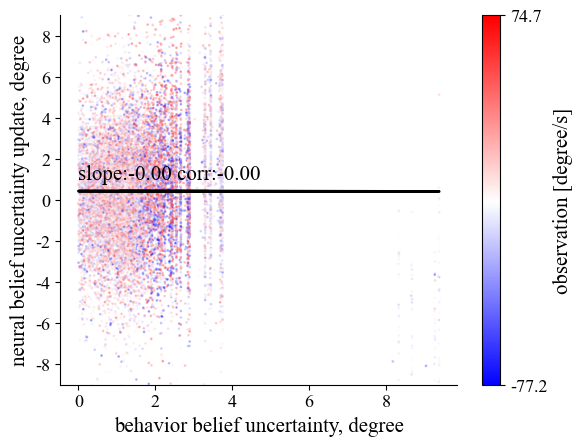

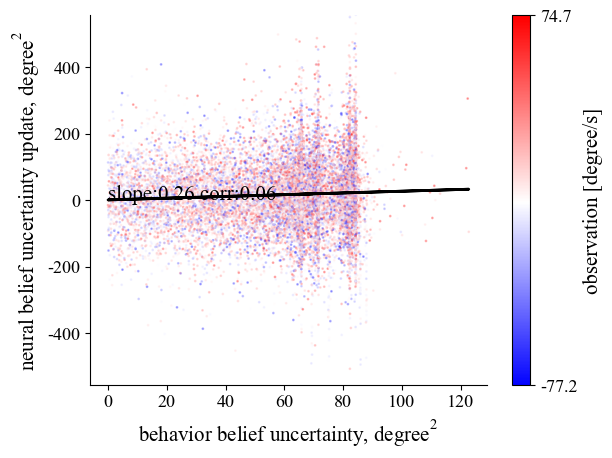

In [43]:

'''
neural belief update, vs uncertainty. color by obs (velocity)
'''
trialstart=2
# fit neural for std
beh_uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
thisc=np.concatenate([a[trialstart:] for a in sessdf.mw.to_numpy()])
model = LinearRegression()
model.fit(neural_data, beh_uncertainty)
pred=model.predict(neural_data) # neural belief uncertainty

fig,ax=plt.subplots(1,1)
mask=np.diff(beh_uncertainty)>0
c=plt.scatter(np.diff(beh_uncertainty)[mask], np.diff(pred)[mask],c=thisc[1:][mask],cmap='bwr', s=1,alpha=0.3)
slope=plot_best_fit(np.diff(beh_uncertainty)[mask], np.diff(pred)[mask],ax=ax)
corr=pearsonr(np.diff(beh_uncertainty)[mask], np.diff(pred)[mask])[0]
ax.text(0,1,f'slope:{slope:.2f} corr:{corr:.2f}')
cbar=plt.colorbar(c, label='observation [degree/s]')
cbar.set_ticks([min(thisc[1:]),max(thisc[1:])])
solidcbar(cbar)
plt.xlabel('behavior belief uncertainty, degree')
plt.ylabel('neural belief uncertainty update, degree')
# plt.axis('equal')
# plt.xlim(0,5)
plt.ylim(-9,9)
plt.show()



# fit neural for variance
beh_uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
model = LinearRegression()
model.fit(neural_data, beh_uncertainty)
pred=model.predict(neural_data) # neural belief uncertainty

fig,ax=plt.subplots(1,1)
mask=np.diff(beh_uncertainty)>0
c=plt.scatter(np.diff(beh_uncertainty)[mask], np.diff(pred)[mask],c=thisc[1:][mask],cmap='bwr', s=1,alpha=0.3)
slope=plot_best_fit(np.diff(beh_uncertainty)[mask], np.diff(pred)[mask],ax=ax)
corr=pearsonr(np.diff(beh_uncertainty)[mask], np.diff(pred)[mask])[0]
ax.text(0,1,f'slope:{slope:.2f} corr:{corr:.2f}')
cbar=plt.colorbar(c, label='observation [degree/s]')
cbar.set_ticks([min(thisc[1:]),max(thisc[1:])])
solidcbar(cbar)
plt.xlabel(r'behavior belief uncertainty, degree$^2$')
plt.ylabel(r'neural belief uncertainty update, degree$^2$')
# plt.xlim(0,130)
plt.ylim(-555,555)
plt.show()

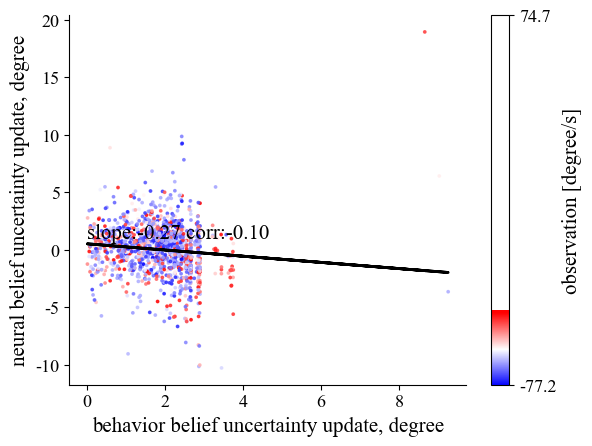

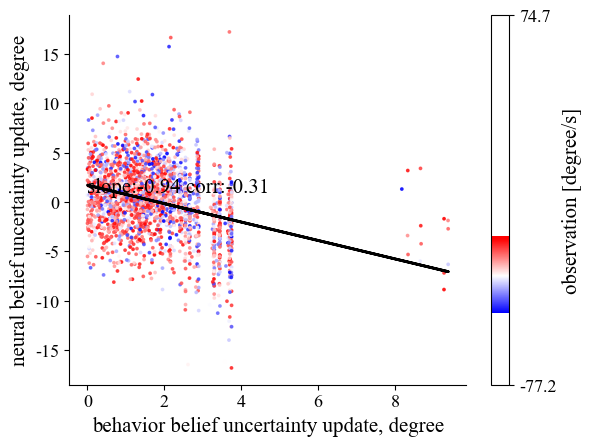

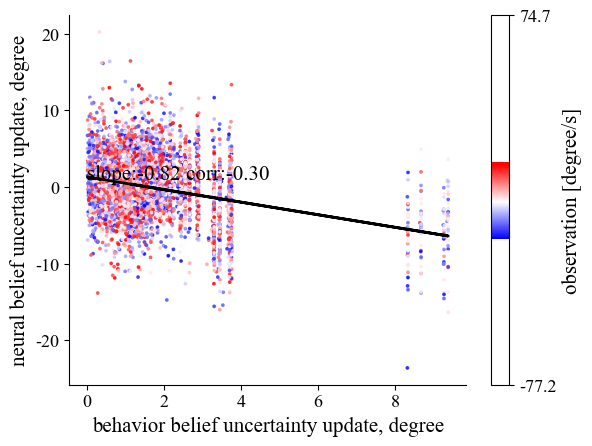

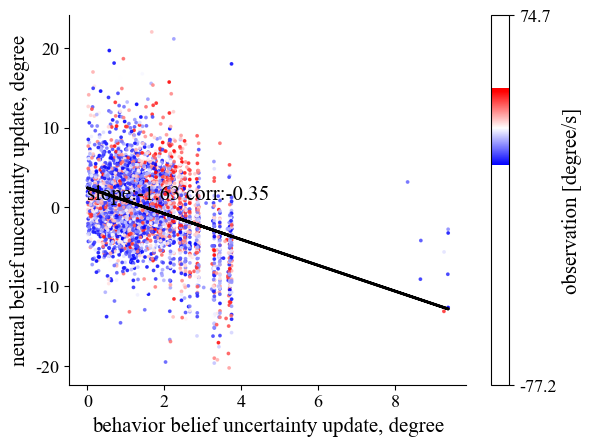

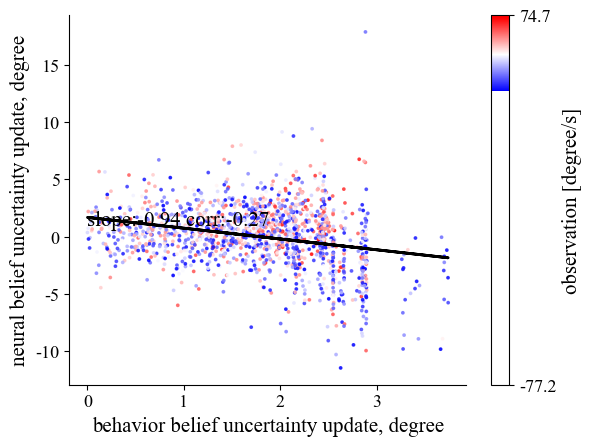

In [44]:
'''
binning obs, plot std
neural belief update, vs uncertainty. color by obs (velocity)
'''
trialstart=2
beh_uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
obs=np.concatenate([a[trialstart:] for a in sessdf.mw.to_numpy()])

data=obs[1:]
num_bins = 5
bin_edges = np.linspace(data.min(), data.max(), num_bins + 1)

for s,e in zip(bin_edges, bin_edges[1:]):
    mask= (e>obs)&(obs>s)&(np.diff(beh_uncertainty, prepend=0)>0)
    
    model = LinearRegression()
    model.fit(neural_data[mask], beh_uncertainty[mask])
    pred=cross_val_predict(model, neural_data[mask], beh_uncertainty[mask])
    # pred=model.predict(neural_data[mask])

    fig,ax=plt.subplots(1,1)
    thisx,thisy=np.diff(beh_uncertainty, prepend=0)[mask], np.diff(pred, prepend=0)
    c=plt.scatter(thisx,thisy,c=obs[mask],cmap='bwr', s=3,alpha=0.8)
    slope=plot_best_fit(thisx,thisy,ax=ax)
    corr=pearsonr(thisx,thisy)[0]
    ax.text(0,1,f'slope:{slope:.2f} corr:{corr:.2f}')
    cbar=plt.colorbar(c, label='observation [degree/s]')
    cbar.set_ticks([min(obs[1:]),max(obs[1:])])
    solidcbar(cbar)
    plt.xlabel('behavior belief uncertainty update, degree')
    plt.ylabel('neural belief uncertainty update, degree')
    # plt.axis('equal')
    # plt.xlim(0,5)
    # plt.ylim(-9,9)
    plt.show()


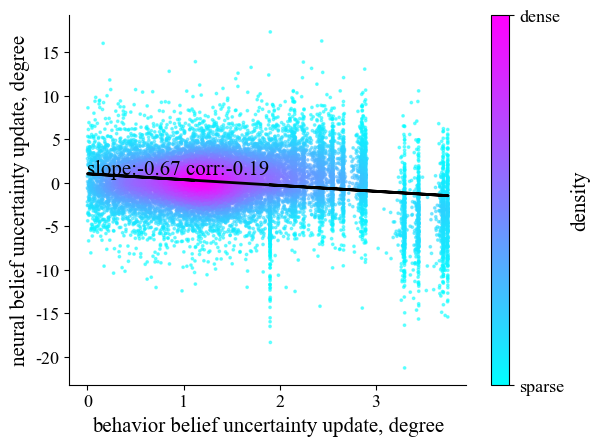

In [45]:
'''
compare beh and neural uncertainty updates
'''
trialstart=1
beh_uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
obs=np.concatenate([a[trialstart:] for a in sessdf.mw.to_numpy()])

behupdate=np.diff(beh_uncertainty, prepend=0)
mask=(behupdate>0)&(behupdate<5) # remove the inter trial point
behupdate=behupdate[mask]

model = LinearRegression()
model.fit(neural_data[mask], beh_uncertainty[mask])
neural_belief=cross_val_predict(model, neural_data[mask], beh_uncertainty[mask])
neuralupdate=np.diff(neural_belief, prepend=0)



fig,ax=plt.subplots(1,1)
scatter_density=compute_scatter_density(behupdate,neuralupdate,)
c=plt.scatter(behupdate,neuralupdate,c=scatter_density,cmap='cool', s=3,alpha=0.5)
cbar=plt.colorbar(c, label=f'density', ticks=[0,1])
cbar.set_ticks([min(scatter_density),max(scatter_density)],labels=['sparse','dense'])
solidcbar(cbar) 
slope=plot_best_fit(behupdate,neuralupdate,ax=ax)
corr=pearsonr(behupdate,neuralupdate)[0]
ax.text(0,1,f'slope:{slope:.2f} corr:{corr:.2f}')
plt.xlabel('behavior belief uncertainty update, degree')
plt.ylabel('neural belief uncertainty update, degree')
# plt.axis('equal')
# plt.xlim(0,5)
# plt.ylim(-9,9)
plt.show()


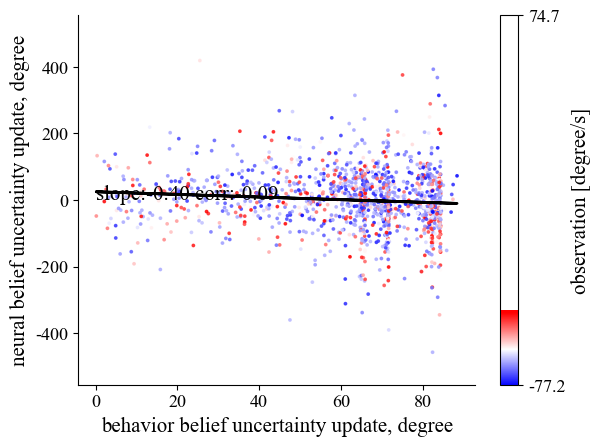

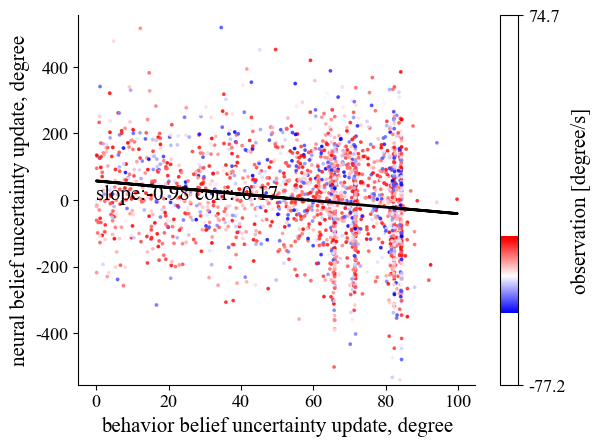

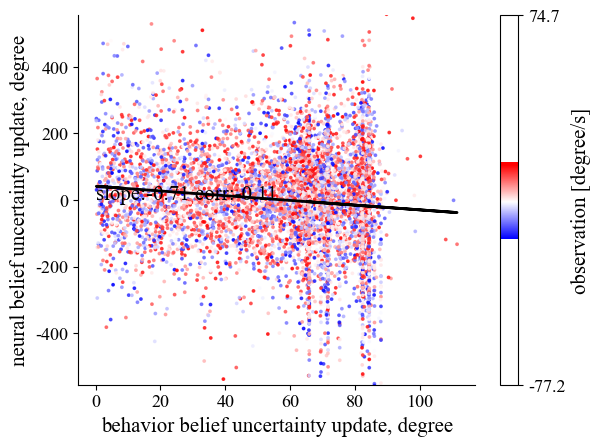

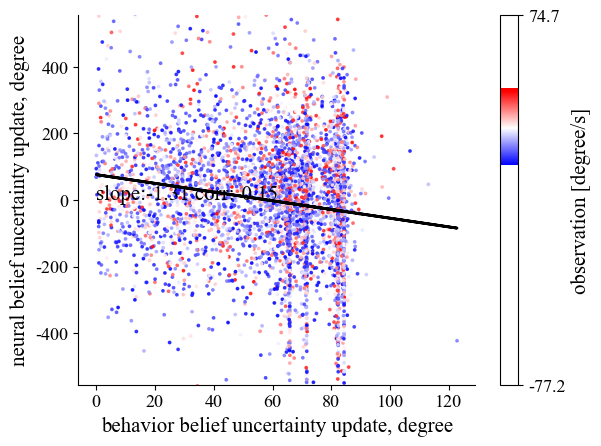

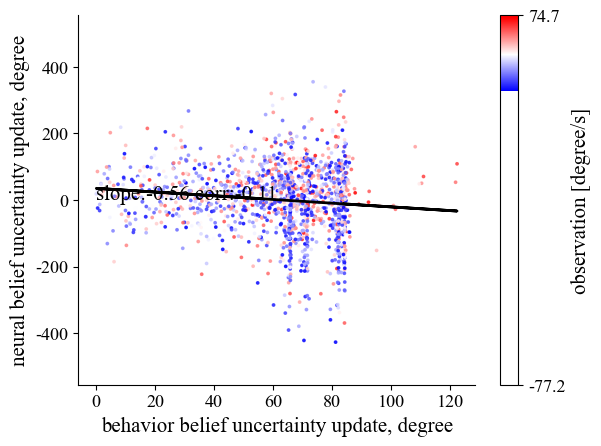

In [47]:
'''
binning obs, plot variance
neural belief update, vs uncertainty. color by obs (velocity)
'''
trialstart=2
beh_uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
obs=np.concatenate([a[trialstart:] for a in sessdf.mw.to_numpy()])

data=obs[1:]
num_bins = 5
bin_edges = np.linspace(data.min(), data.max(), num_bins + 1)

for s,e in zip(bin_edges, bin_edges[1:]):
    mask= (e>obs)&(obs>s)&(np.diff(beh_uncertainty, prepend=0)>0)
    
    model = LinearRegression()
    model.fit(neural_data[mask], beh_uncertainty[mask])
    pred=cross_val_predict(model, neural_data[mask], beh_uncertainty[mask])
    # pred=model.predict(neural_data[mask])

    fig,ax=plt.subplots(1,1)
    thisx,thisy=np.diff(beh_uncertainty, prepend=0)[mask], np.diff(pred, prepend=0)
    c=plt.scatter(thisx,thisy,c=obs[mask],cmap='bwr', s=3,alpha=0.8)
    slope=plot_best_fit(thisx,thisy,ax=ax)
    corr=pearsonr(thisx,thisy)[0]
    ax.text(0,1,f'slope:{slope:.2f} corr:{corr:.2f}')
    cbar=plt.colorbar(c, label='observation [degree/s]')
    cbar.set_ticks([min(obs[1:]),max(obs[1:])])
    solidcbar(cbar)
    plt.xlabel('behavior belief uncertainty update, degree')
    plt.ylabel('neural belief uncertainty update, degree')
    # plt.axis('equal')
    # plt.xlim(0,5)
    plt.ylim(-555,555)
    plt.show()


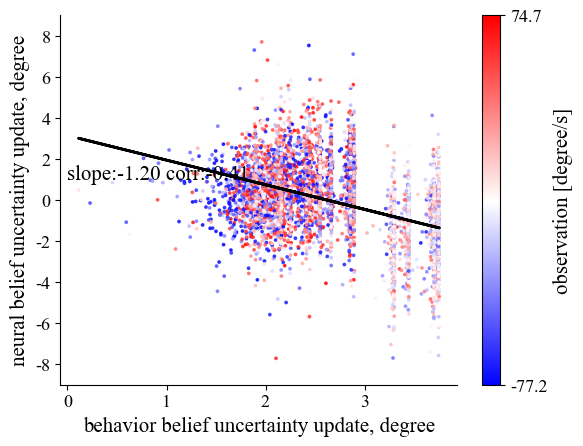

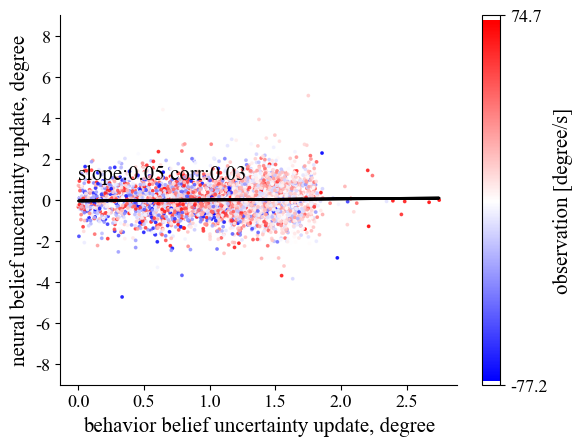

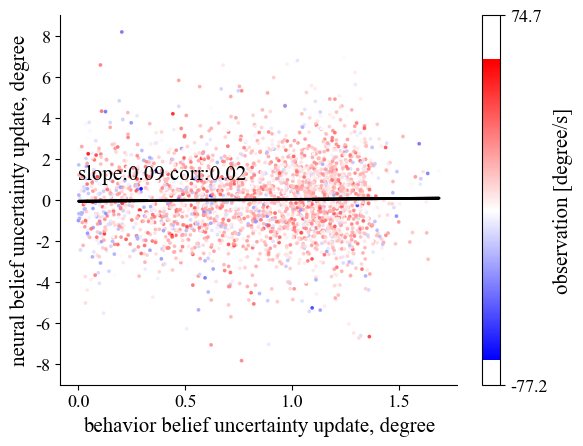

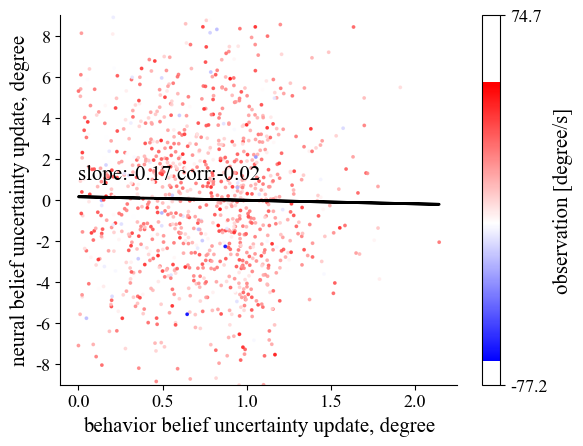

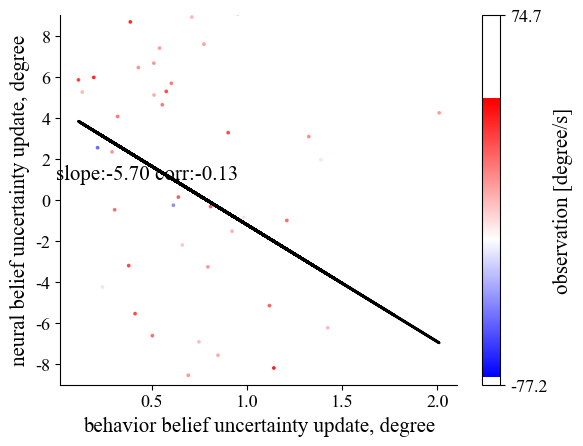

In [49]:
'''
binning timer
neural belief update, vs uncertainty. color by obs (velocity)
'''

trialstart=2

beh_uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
obs=np.concatenate([a[trialstart:] for a in sessdf.mw.to_numpy()])

thistime=np.concatenate([a[trialstart:] for a in sessdf.timer.to_numpy()])

data=thistime
bin_edges = np.arange(data.min(), data.max(), 5)

for s,e in zip(bin_edges, bin_edges[1:]):
    mask= (e>thistime)&(thistime>s)&(np.diff(beh_uncertainty, prepend=0)>0)

    model = LinearRegression()
    model.fit(neural_data[mask], beh_uncertainty[mask])
    pred=cross_val_predict(model, neural_data[mask], beh_uncertainty[mask])

    fig,ax=plt.subplots(1,1)
    thisx,thisy=np.diff(beh_uncertainty, prepend=0)[mask], np.diff(pred, prepend=0)
    c=plt.scatter(thisx,thisy,c=obs[mask],cmap='bwr', s=3,alpha=0.8)
    slope=plot_best_fit(thisx,thisy,ax=ax)
    corr=pearsonr(thisx,thisy)[0]

    ax.text(0,1,f'slope:{slope:.2f} corr:{corr:.2f}')
    cbar=plt.colorbar(c, label='observation [degree/s]')
    cbar.set_ticks([min(thisc[1:]),max(thisc[1:])])
    solidcbar(cbar)
    plt.xlabel('behavior belief uncertainty update, degree')
    plt.ylabel('neural belief uncertainty update, degree')
    # plt.axis('equal')
    # plt.xlim(0,5)
    plt.ylim(-9,9)
    plt.show()


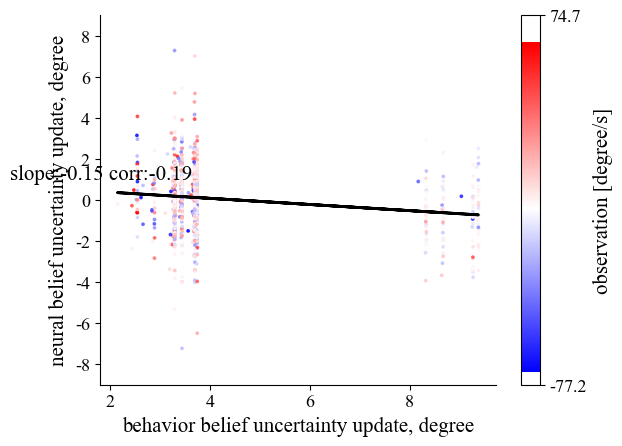

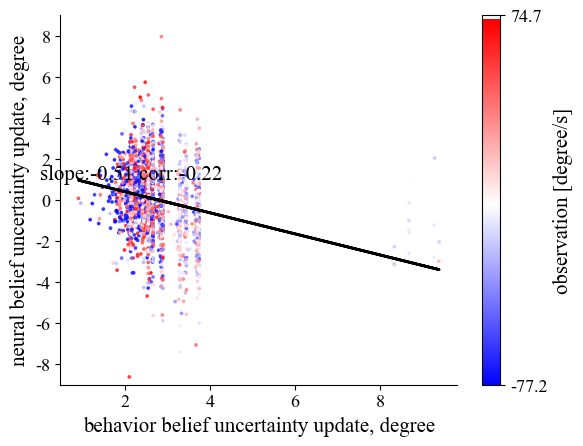

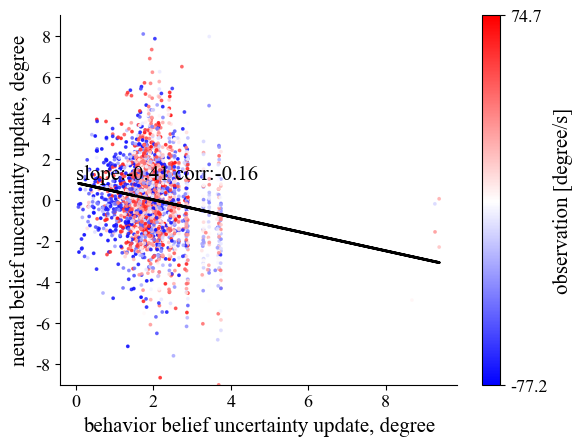

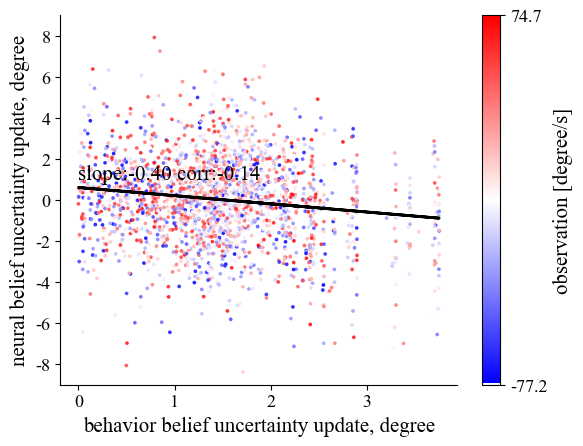

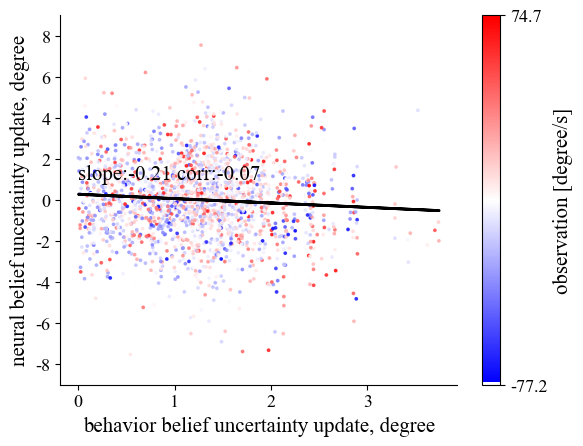

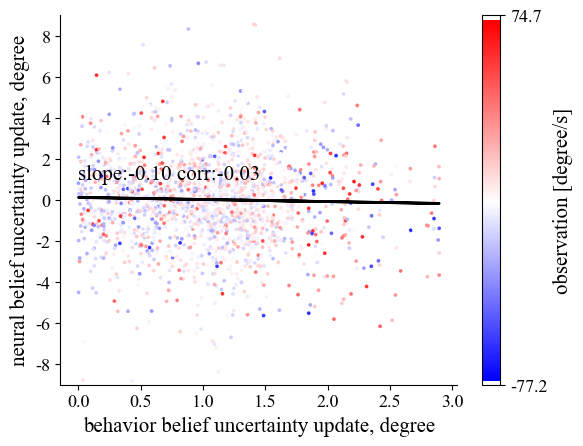

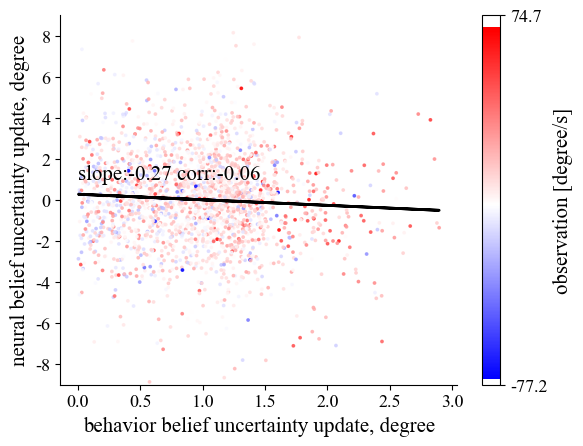

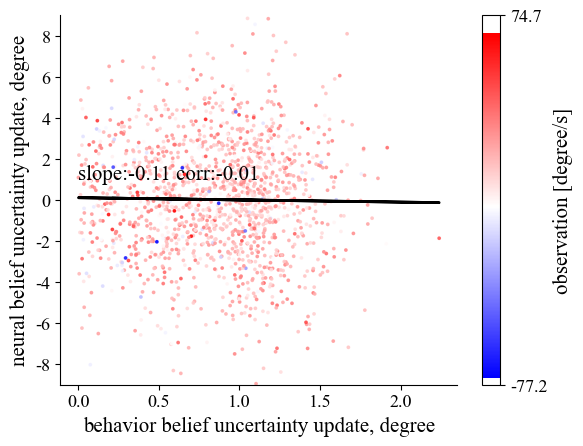

In [51]:
'''
binning time ratio
neural belief update, vs uncertainty. color by obs (velocity)
'''

trialstart=2

beh_uncertainty=np.concatenate([a[trialstart:] for a in sessdf.relcov.to_numpy()])[:,0,0]**0.5
neural_data=np.concatenate([a[trialstart:] for a in sessdf.PPC_var.to_numpy()])
obs=np.concatenate([a[trialstart:] for a in sessdf.mw.to_numpy()])

thistime=np.concatenate([a[trialstart:] for a in sessdf.time_ratio.to_numpy()])

data=thistime
num_bins=9
bin_edges = np.linspace(data.min(), data.max(), num_bins)

for s,e in zip(bin_edges, bin_edges[1:]):
    mask= (e>thistime)&(thistime>s)&(np.diff(beh_uncertainty, prepend=0)>0)

    model = LinearRegression()
    model.fit(neural_data[mask], beh_uncertainty[mask])
    pred=cross_val_predict(model, neural_data[mask], beh_uncertainty[mask])

    fig,ax=plt.subplots(1,1)
    thisx,thisy=np.diff(beh_uncertainty, prepend=0)[mask], np.diff(pred, prepend=0)
    c=plt.scatter(thisx,thisy,c=obs[mask],cmap='bwr', s=3,alpha=0.8)
    slope=plot_best_fit(thisx,thisy,ax=ax)
    corr=pearsonr(thisx,thisy)[0]

    ax.text(0,1,f'slope:{slope:.2f} corr:{corr:.2f}')
    cbar=plt.colorbar(c, label='observation [degree/s]')
    cbar.set_ticks([min(thisc[1:]),max(thisc[1:])])
    solidcbar(cbar)
    plt.xlabel('behavior belief uncertainty update, degree')
    plt.ylabel('neural belief uncertainty update, degree')
    # plt.axis('equal')
    # plt.xlim(0,5)
    plt.ylim(-9,9)
    plt.show()
